# Customer Segmentation 

## Introduction to Customer Segmentation

Customer segmentation is a powerful technique in data science that enables businesses to categorize their customers into distinct groups based on shared characteristics. This approach is pivotal in understanding customer behavior, optimizing marketing strategies, and enhancing customer service. In this assignment, we will delve into the practical application of customer segmentation using machine learning algorithms.

- **Significance of Customer Segmentation**:
  - **Targeted Marketing**: Tailoring marketing campaigns to specific customer groups based on their purchasing behavior and preferences.
  - **Product Customization**: Developing products and services that cater to the specific needs and desires of different customer segments.
  - **Improved Customer Experience**: Delivering personalized experiences to customers, increasing satisfaction and loyalty.

The example code provided serves as a starting point for this exploration. It demonstrates the application of K-Means clustering, a popular technique in machine learning for grouping data. This algorithm partitions customers into clusters based on features like transaction amount, account balance, and transaction frequency.

- **Key Techniques and Concepts**:
  - **K-Means Clustering**: Understand and apply K-Means to segment customers.
  - **Data Standardization**: Learn the importance of scaling features for effective clustering.
  - **Cluster Visualization**: Gain skills in visualizing the clusters to extract meaningful insights.

Students are encouraged to expand upon this initial code by experimenting with different numbers of clusters, applying additional clustering techniques like Hierarchical Clustering and DBSCAN, and performing a thorough analysis of the clusters to understand their business implications. This assignment is not only a technical task but also a venture into strategic business analysis through the lens of data science.


C:\Users\james\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\james\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


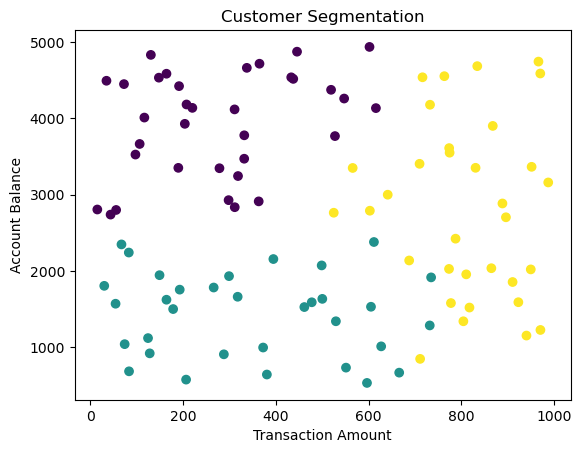

   TransactionAmount  AccountBalance  TransactionFrequency
0         275.815037     3936.395005              4.882353
1         346.991782     1436.081519              4.121212
2         809.680410     2812.004700              5.787879


In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Generate sample data 
np.random.seed(42)
data = pd.DataFrame({
    'TransactionAmount': np.random.uniform(10, 1000, 100),
    'AccountBalance': np.random.uniform(500, 5000, 100),
    'TransactionFrequency': np.random.poisson(5, 100)
})

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

# Choose the number of clusters (you may want to experiment with this)
num_clusters = 3

# Apply KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
data['Cluster'] = kmeans.fit_predict(scaled_data)

# Visualize the clusters (for two features)
plt.scatter(data['TransactionAmount'], data['AccountBalance'], c=data['Cluster'], cmap='viridis')
plt.title('Customer Segmentation')
plt.xlabel('Transaction Amount')
plt.ylabel('Account Balance')
plt.show()

# Display the cluster centers (in the standardized feature space)
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=data.columns[:-1])
print(cluster_centers_df)

## Customer Segmentation Coding Assignment

### Main Assignment (100 points total)

#### 1. Data Exploration and Analysis (20 points)
- **Background**: Understanding the dataset's structure and key characteristics.
- **Tasks**:
  - Explore the distribution of features like 'Annual Income' and 'Spending Score'.
  - Identify any interesting patterns or insights from the data.
- **Points**: Detailed analysis and insights from data exploration.

#### 2. Enhanced Clustering with K-Means (20 points)
- **Background**: Application of K-Means clustering to the standardized data.
- **Tasks**:
  - Experiment with different numbers of clusters.
  - Justify the chosen number of clusters based on your analysis.
- **Points**: Creativity in experimenting with cluster numbers and justification.

**Example Code**
```python
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(scaled_data)
```

#### 3. Advanced Implementation of Hierarchical Clustering (20 points)
- **Background**: Applying and interpreting Hierarchical Clustering.
- **Tasks**:
  - Analyze the dendrogram to determine the optimal number of clusters.
  - Provide insights into how hierarchical clustering segments customers differently than K-Means.
- **Points**: Quality of analysis and interpretation of hierarchical clustering results.

**Example Code**
```python
Z = linkage(scaled_data, 'ward')
dendrogram(Z)
plt.show()
```

#### 4. Comprehensive Cluster Analysis (20 points)
- **Background**: Deeper evaluation of the clustering results.
- **Tasks**:
  - Compare the characteristics of the clusters from both clustering methods.
  - Calculate and interpret additional cluster quality metrics beyond silhouette score.
- **Points**: Depth of comparative analysis and use of additional metrics.

**Example Code**
```python
silhouette_avg = silhouette_score(scaled_data, kmeans.labels_)
```

#### 5. Insightful Reporting and Visualization (20 points)
- **Background**: Effective communication of findings.
- **Tasks**:
  - Create insightful visualizations to represent the clustering results.
  - Write a comprehensive report discussing findings, methodologies, and potential business implications.
- **Points**: Clarity, creativity, and thoroughness in reporting and visualization.

**Example Code**
```python
plt.scatter(data['Annual Income (k$)'], data['Spending Score (1-100)'], c=kmeans.labels_)
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.show()
```

## Summarized Grading Rubric for Customer Segmentation Coding Assignment

### Main Assignment (100 points total)
- **1. Data Exploration and Analysis (20 points)**
- **2. Enhanced Clustering with K-Means (20 points)**
- **3. Advanced Implementation of Hierarchical Clustering (20 points)**
- **4. Comprehensive Cluster Analysis (20 points)**
- **5. Insightful Reporting and Visualization (20 points)**

### Summary Statement about the Assignment
In this assignment, we will engage in a practical application of customer segmentation, utilizing a range of machine learning techniques. We will conduct a thorough data exploration to uncover underlying patterns, apply and justify the use of K-Means clustering, explore the depth of hierarchical clustering, and provide a comprehensive analysis of the clustering results. Furthermore, we are expected to effectively communicate their findings through insightful visualizations and detailed reports, demonstrating their ability to translate technical analysis into actionable business insights. The assignment is designed not only to test technical proficiency but also to enhance our analytical thinking and their ability to draw meaningful conclusions from complex datasets.


In [22]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import skew, kurtosis
import seaborn as sns

# Load the dataset
file_path = 'Mall_Customers.csv'
data = pd.read_csv(file_path)
data.head(20)


,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
5,6,Female,22,17,76
6,7,Female,35,18,6
7,8,Female,23,18,94
8,9,Male,64,19,3
9,10,Female,30,19,72


In [33]:
data.isnull().sum()

CustomerID                0
Gender                    0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

In [34]:
data.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


In [125]:
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
scaled_df = pd.DataFrame(scaled_data, columns=features.columns)
scaled_df

,Annual Income (k$),Spending Score (1-100)
0,-1.738999,-0.434801
1,-1.738999,1.195704
2,-1.700830,-1.715913
3,-1.700830,1.040418
4,-1.662660,-0.395980
...,...,...
195,2.268791,1.118061
196,2.497807,-0.861839
197,2.497807,0.923953
198,2.917671,-1.250054


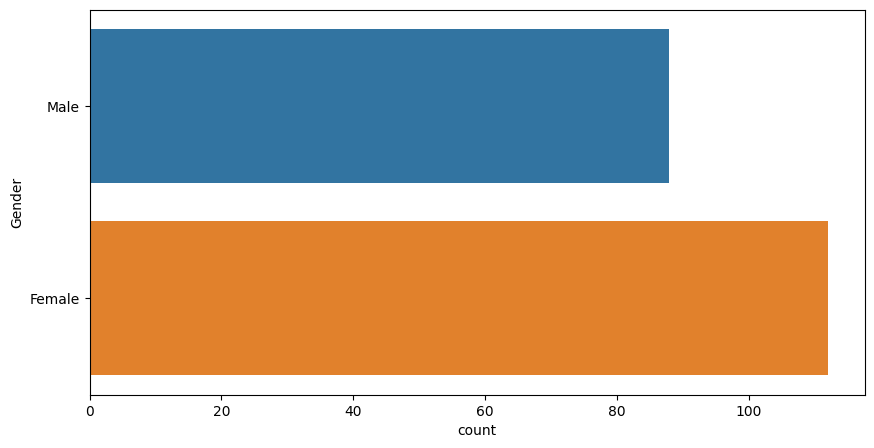

In [66]:
plt.figure(1 , figsize = (10 , 5))
sns.countplot(y = 'Gender' , data = data, hue='Gender')
plt.show()

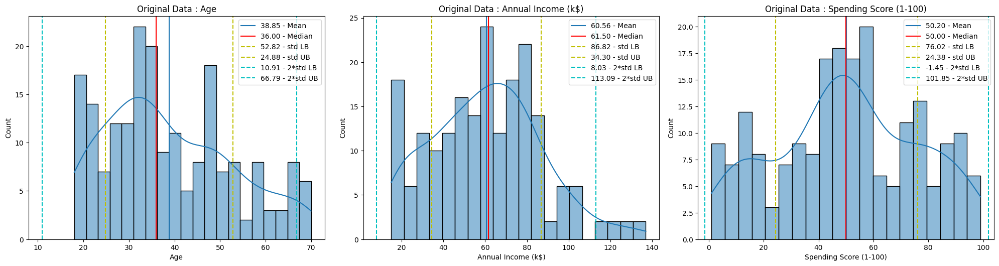

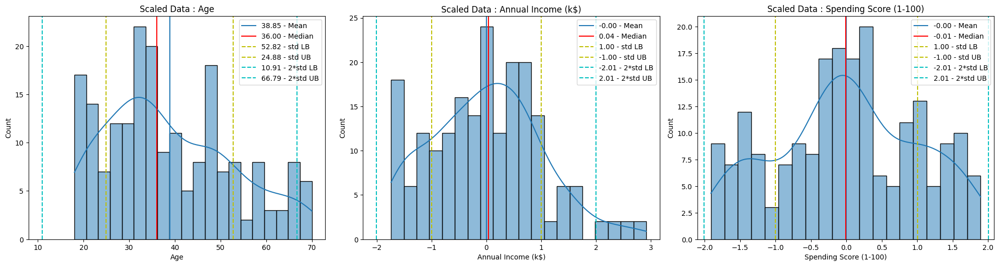

In [58]:
features = ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']

def plot_distribution_for_features(data:pd.DataFrame, features, title):
    import seaborn as sns
    # Plotting side-by-side histograms for comparison
    plt.figure(figsize=(20, 10))
    for i, feature in enumerate(features):
        plt.subplot(2, len(features), i+1)
        sns.histplot(data[feature], bins=20, kde=True)
        plt.title(f'{title} : {feature}')
        mean = data[feature].mean(); median = data[feature].median()
        std = data[feature].std(); mpstd = mean + std; mmstd = mean - std
        mm_dstd = mean - 2*std ; mp_dstd = mean +2*std
        plt.axvline(mean, label=f"{mean:.2f} - Mean")
        plt.axvline(median, color="red", label=f"{median:.2f} - Median")
        plt.axvline(mpstd, color="y", label=f"{mpstd:.2f} - std LB", linestyle='dashed')
        plt.axvline(mmstd, color="y", label=f"{mmstd:.2f} - std UB", linestyle='dashed')
        plt.axvline(mm_dstd, color="c", label=f"{mm_dstd:.2f} - 2*std LB", linestyle='dashed')
        plt.axvline(mp_dstd, color="c", label=f"{mp_dstd:.2f} - 2*std UB", linestyle='dashed')
        plt.legend()
    plt.tight_layout()
    plt.show()
    
plot_distribution_for_features(data, features, 'Original Data')
plot_distribution_for_features(scaled_df, features, 'Scaled Data')

In [61]:
def basic_stat_analysis(data:pd.DataFrame, features):
    for feature in features: 
        mean = data[feature].mean(); median = data[feature].median()
        std = data[feature].std(); mpstd = mean + std; mmstd = mean - std
        mm_dstd = mean - 2*std ; mp_dstd = mean +2*std
        print(f"------------- Stats for feature : {feature}")
        print(f"Mean: {mean:.2f} - Mean")
        print(f"Median: {median:.2f} - Median")
        print(f"Mean plus standard deviation: {mpstd:.2f}")
        print(f"Mean minus standard deviation {mmstd:.2f}")
        print(f"Mean plus 2 * standard deviation {mp_dstd:.2f}")
        print(f"Mean minus 2 * standard deviation {mm_dstd:.2f}")


features = ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']
basic_stat_analysis(data, features)

------------- Stats for feature : Age
Mean: 38.85 - Mean
Median: 36.00 - Median
Mean plus standard deviation: 52.82
Mean minus standard deviation 24.88
Mean plus 2 * standard deviation 66.79
Mean minus 2 * standard deviation 10.91
------------- Stats for feature : Annual Income (k$)
Mean: 60.56 - Mean
Median: 61.50 - Median
Mean plus standard deviation: 86.82
Mean minus standard deviation 34.30
Mean plus 2 * standard deviation 113.09
Mean minus 2 * standard deviation 8.03
------------- Stats for feature : Spending Score (1-100)
Mean: 50.20 - Mean
Median: 50.00 - Median
Mean plus standard deviation: 76.02
Mean minus standard deviation 24.38
Mean plus 2 * standard deviation 101.85
Mean minus 2 * standard deviation -1.45


Let's analyze the provided statistics for the features: Age, Annual Income, and Spending Score.

1. **Age**:
   - The mean age of the sample population is 38.85 years, which suggests a relatively mature demographic.
   - The median age, at 36 years, indicates that the distribution might be slightly right-skewed since the mean is higher than the median.
   - With a standard deviation of approximately 13.97 years, the age distribution is somewhat spread out from the mean.
   - The range of one standard deviation from the mean (24.88 to 52.82) encompasses a substantial portion of the data, indicating that most individuals fall within this range.
   - The range of two standard deviations from the mean (10.91 to 66.79) covers an even larger portion of the data, suggesting that the distribution is relatively normal with some outliers towards older and younger age groups.

2. **Annual Income**:
   - The mean annual income is $60.56k, with a median income of $61.50k, indicating a relatively symmetrical distribution.
   - The standard deviation of approximately $26.26k suggests a moderate level of variability in incomes within the sample.
   - The range of one standard deviation from the mean (34.30 to 86.82) covers a significant portion of the income distribution.
   - The range of two standard deviations from the mean (8.03 to 113.09) encompasses nearly all of the data points, indicating that the distribution is relatively normal, with few extreme outliers.

3. **Spending Score**:
   - The mean spending score is 50.20, with a median of 50.00, suggesting a relatively balanced distribution around the mean.
   - The standard deviation of approximately 12.41 indicates a moderate level of variability in spending behavior within the sample.
   - The range of one standard deviation from the mean (24.38 to 76.02) covers a significant portion of the spending score distribution.
   - The upper range of two standard deviations from the mean (101.85) suggests that there might be some outliers with very high spending scores, while the lower range (-1.45) implies potential errors or extreme outliers with negative scores (which might need further investigation).

Overall, these statistics provide valuable insights into the age, income, and spending behaviors of the sample population, highlighting areas of concentration and potential outliers that could inform marketing strategies or segmentation efforts.

In summary, these insights suggest that while the distributions for all three features are roughly symmetrical, there may be some degree of variability or outliers, particularly when considering two standard deviations from the mean. Further analysis, such as visualization or hypothesis testing, could provide additional insights into the data distribution and potential patterns.

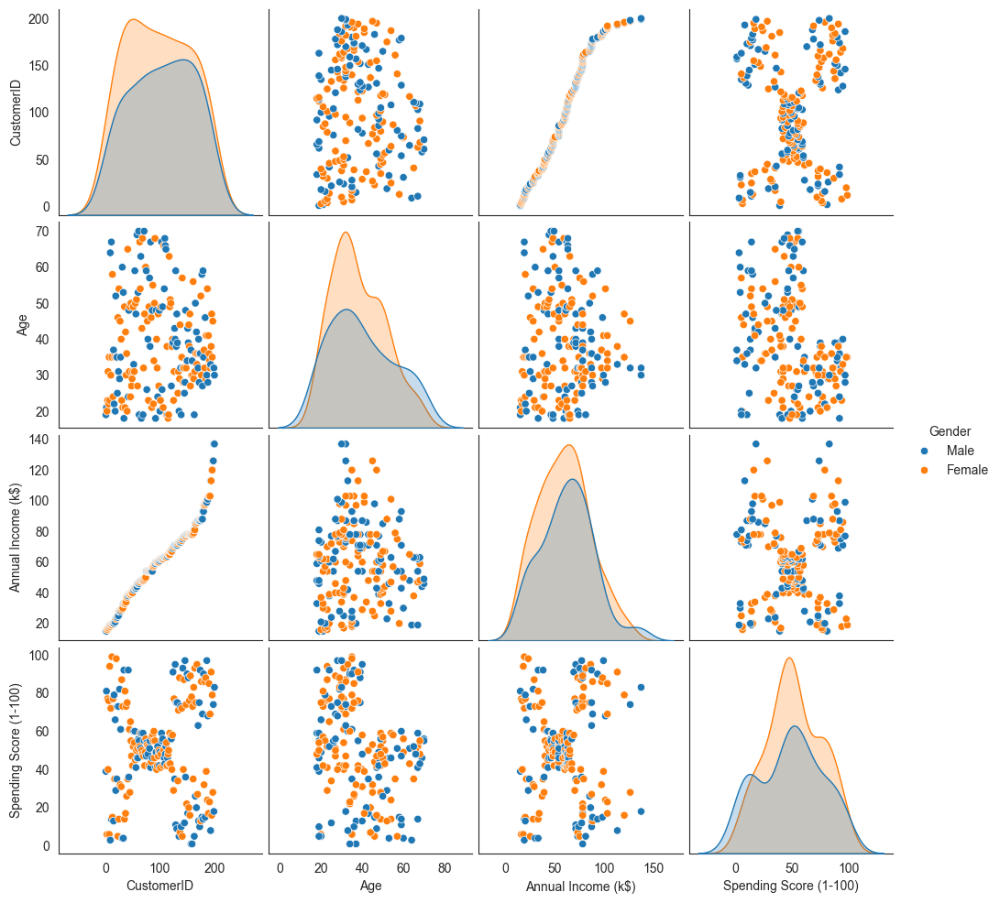

In [379]:
sns.pairplot(data, hue="Gender")

### Pairplot Analysis
looking at the pair plot we can see that there's some sort of clustering/grouping of customers in the "Annual Income" vs. "Spending Score" plot. I'll explore this later. 

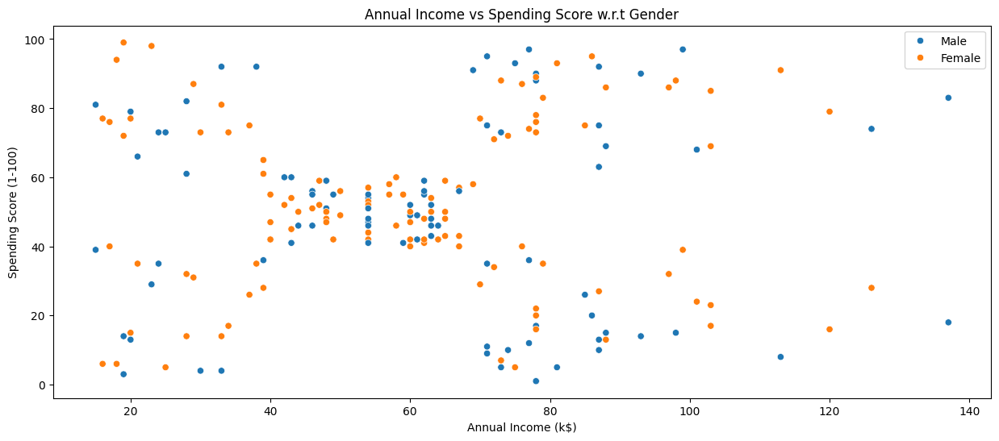

In [69]:
# Let's get some insight into spending score, annual income with respect to gender
plt.figure(1 , figsize = (15 , 6))
sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Gender')
plt.title('Annual Income vs Spending Score w.r.t Gender')
plt.legend()
plt.show()

Something interesting seems to be happening from annual income range of (40 -70) in terms of spending score.

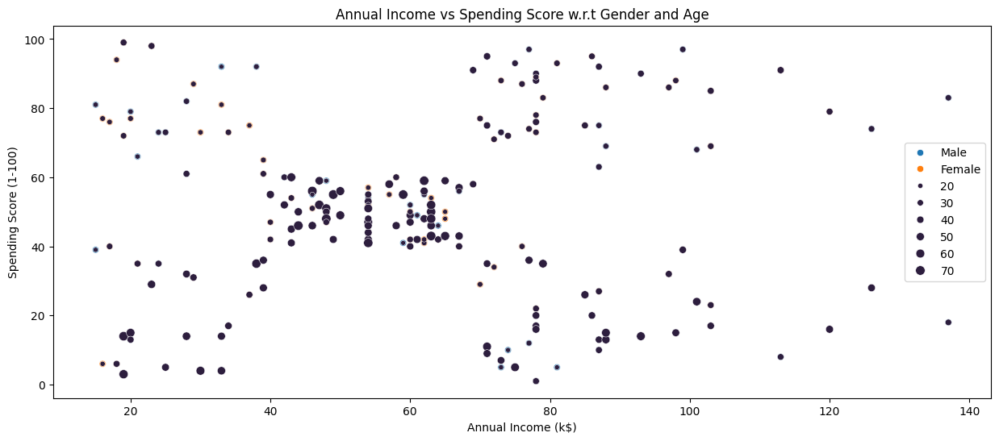

In [83]:
# Let's get some insight into spending score, annual income with respect to gender and also create visuals for Age
# without using a 3d plot, this graph still gives good information, specially when combined with the graph above
# For example it looks like most older adults are clustered in the (40-70K) income range with spending score range of (~40 - 60)
plt.figure(1 , figsize = (15 , 6))
sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Gender')
sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Age', size='Age', sizes=(18,70), hue_norm=(0,7))
plt.title('Annual Income vs Spending Score w.r.t Gender and Age')
plt.legend()
plt.show()

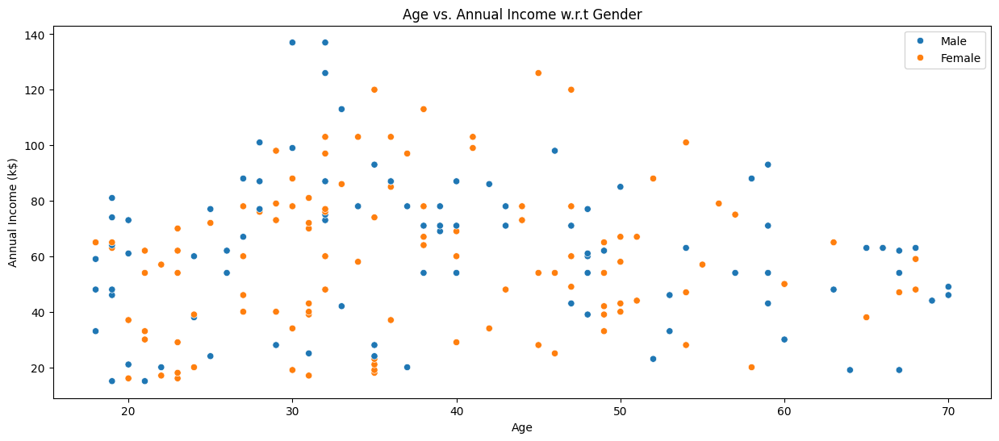

In [70]:
# Let's repeat this for Age vs Annual Income with respect to Gender
plt.figure(1 , figsize = (15 , 6))
sns.scatterplot(data=data, y='Annual Income (k$)', x='Age', hue='Gender')
plt.title('Age vs. Annual Income w.r.t Gender')
plt.legend()
plt.show()

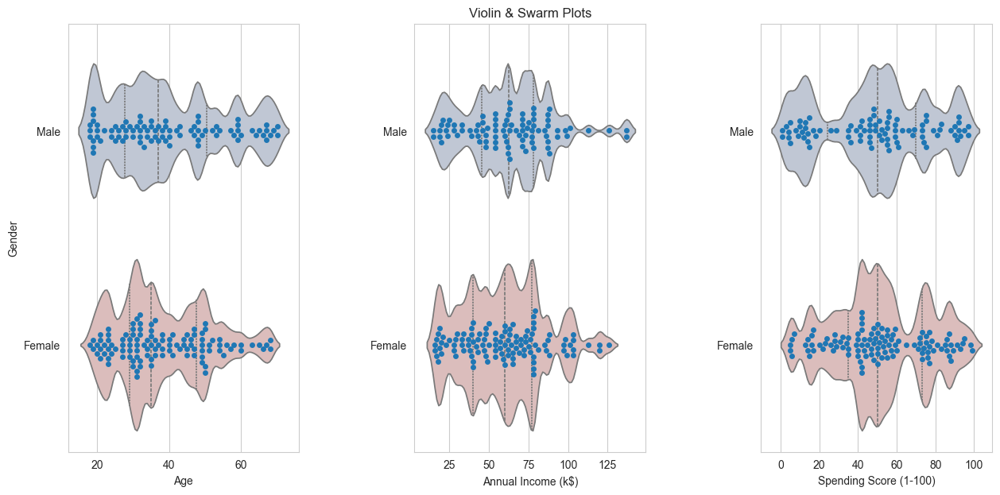

In [113]:
# Plotting Viloin and Swarm plots using seaborn 
# Swarm plot to help see the distribution or count of each of the features wrt Gender
# Violin plot to help use see categorical distribution of features, kde and quartiles
# {darkgrid, whitegrid, dark, white, ticks}
plt.figure(1 , figsize = (15 , 7))
sns.set_style('whitegrid')
for i, feature in enumerate(features):
    plt.subplot(1 , 3 , i+1)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.violinplot(x = feature , y = 'Gender' , data = data , hue='Gender', 
                   palette = 'vlag',  inner='quartiles', 
                   density_norm='count', common_norm=True, bw_method=0.1)
    sns.swarmplot(x = feature , y = 'Gender' , data = data, dodge=True)
    plt.ylabel('Gender' if i+1 == 1 else '')
    plt.title('Violin & Swarm Plots' if i+1 == 2 else '')
plt.show()

### Swarm and Viloin Plots
Here I have made a Swarm plot to help see the distribution and count of each of the features wrt Gender. I've also included the Violin plot to help use see categorical distribution of features, kde and quartiles as dotted lines inside the Violin plot.

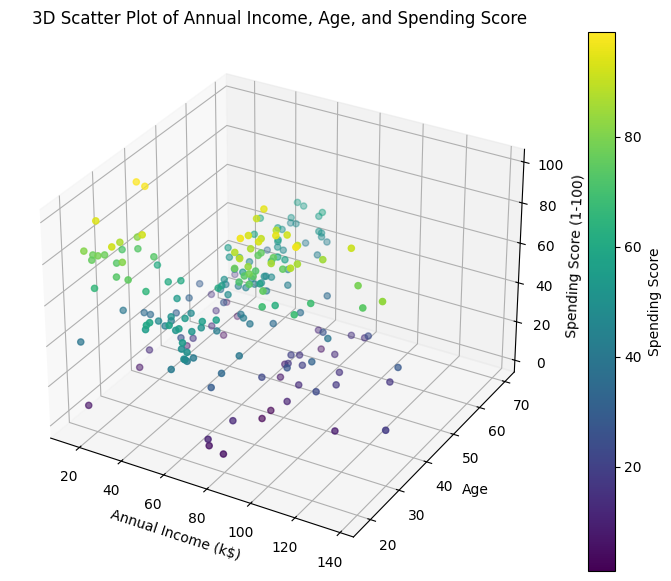

In [80]:
# using what James provided on "Lesson 3 Data Management and Preprocessing" Assignment key to create 3D plot
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample a subset of the data for clearer visualization
sampled_data = data

# Selecting the variables for the 3D scatter plot
x = sampled_data['Annual Income (k$)']
y = sampled_data['Age']
z = sampled_data['Spending Score (1-100)']
c = sampled_data['Gender']

# Creating the plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(x, y, z, c=z, cmap='viridis', marker='o')

# Adding labels and title
ax.set_xlabel('Annual Income (k$)')
ax.set_ylabel('Age')
ax.set_zlabel('Spending Score (1-100)')
ax.set_title('3D Scatter Plot of Annual Income, Age, and Spending Score')

# Adding a color bar
cbar = fig.colorbar(scatter, ax=ax, extend='neither', orientation='vertical')
cbar.set_label('Spending Score')

plt.show()

In [75]:
# using what James provided on "Lesson 3 Data Management and Preprocessing" Assignment key to create an interactive 3D plot
import plotly.express as px

# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(data,
                    x='Annual Income (k$)',
                    y='Age',
                    z='Spending Score (1-100)',
                    color='Gender',
                    title='Interactive 3D Scatter Plot of ')

# Update the layout to adjust the size
fig.update_layout(width=700, height=500)  # You can adjust these values as needed

# Show the plot
fig.show()

#### 2. Enhanced Clustering with K-Means
I'll start exploring number of clusters when using k-means clustering. I will show different results based on number of clusters chosen. One thing that k-means doesn't automatically do for us is selecting the appropriate number of clusters. I'll use a few techniques in the following sections to find appropriate number of clusters. 

These techniques would be the following:
1. Running K-Means for a range of cluster numbers, graphing the results and visually and manually making sense of the results. 
2. Running the Elbow method to help in choosing the optimal number of clusters
3. Running the Silhouette method and analyzing the results of the Silouhette graphs for both selecting the number of clusters and also judging how appropriate the cluster choice is using Sihouette plot for kmeans clustering. 

In addition to this, I'll explore what makes sense in terms of business case and customers that could be targeted from this batch. This would be for example the following categories we observed from the pairplot above:

1. Low Income and Low Spending
2. Low Income and High Spending
3. Middle Income and Middle Spending
4. High Income and Low Spending
5. High Income and High Spending

In later sections I will also engineer features that are not part of the original dataset and will see how that changes the analysis. 

In [133]:
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
scaled_df = pd.DataFrame(scaled_data, columns=features.columns)
scaled_df

,Annual Income (k$),Spending Score (1-100)
0,-1.738999,-0.434801
1,-1.738999,1.195704
2,-1.700830,-1.715913
3,-1.700830,1.040418
4,-1.662660,-0.395980
...,...,...
195,2.268791,1.118061
196,2.497807,-0.861839
197,2.497807,0.923953
198,2.917671,-1.250054


In [136]:
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state= 42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)
data


,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Cluster
0,1,Male,19,15,39,0
1,2,Male,21,15,81,2
2,3,Female,20,16,6,0
3,4,Female,23,16,77,2
4,5,Female,31,17,40,0
...,...,...,...,...,...,...
195,196,Female,35,120,79,1
196,197,Female,45,126,28,3
197,198,Male,32,126,74,1
198,199,Male,32,137,18,3


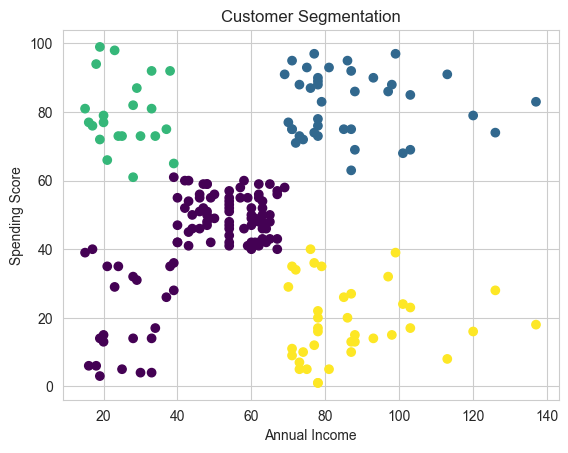

array([[48.16831683, 43.3960396 ],
       [86.53846154, 82.12820513],
       [25.72727273, 79.36363636],
       [87.        , 18.63157895]])

In [138]:
plt.scatter(y=data['Spending Score (1-100)'], x=data['Annual Income (k$)'], c=data['Cluster'], cmap='viridis')
plt.title('Customer Segmentation')
plt.xlabel('Annual Income')
plt.ylabel('Spending Score')
plt.show()

# Display the cluster centers (in the standardized feature space)
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers


In [142]:
cluster_centers_df = pd.DataFrame(cluster_centers, columns=data.columns[3:5])
print(cluster_centers_df)

   Annual Income (k$)  Spending Score (1-100)
0           48.168317               43.396040
1           86.538462               82.128205
2           25.727273               79.363636
3           87.000000               18.631579


### Run with different numbers of clusters
Let's run the clustering with different number of clusters and graph the results to visually assess how increasing the number of clusters on kmeans algorithm, results in different customer segmentations. I can then better decide if this segmentation is meaningful in the context of features selected. 

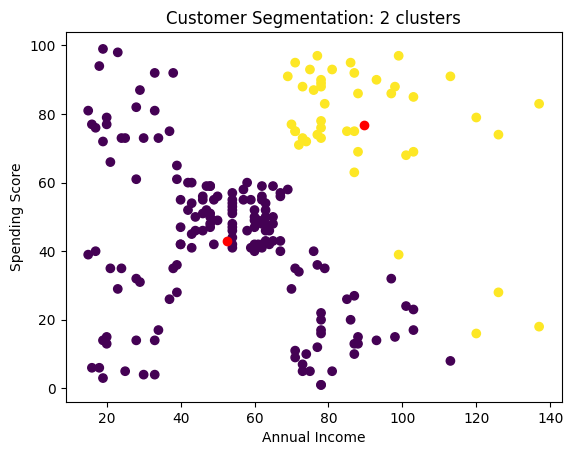

   Annual Income (k$)  Spending Score (1-100)
0           52.579618               42.904459
1           89.697674               76.837209


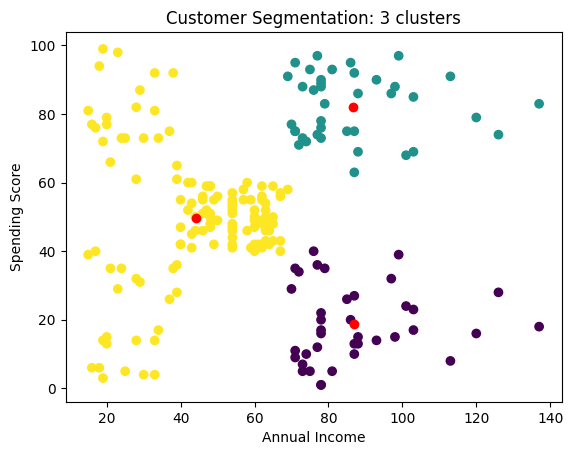

   Annual Income (k$)  Spending Score (1-100)
0           87.000000               18.631579
1           86.538462               82.128205
2           44.154472               49.829268


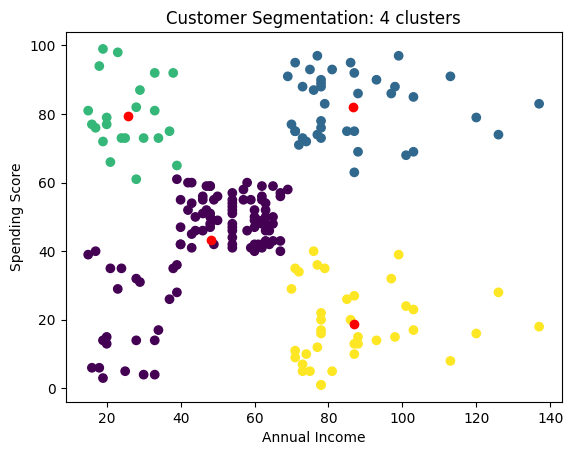

   Annual Income (k$)  Spending Score (1-100)
0           48.168317               43.396040
1           86.538462               82.128205
2           25.727273               79.363636
3           87.000000               18.631579


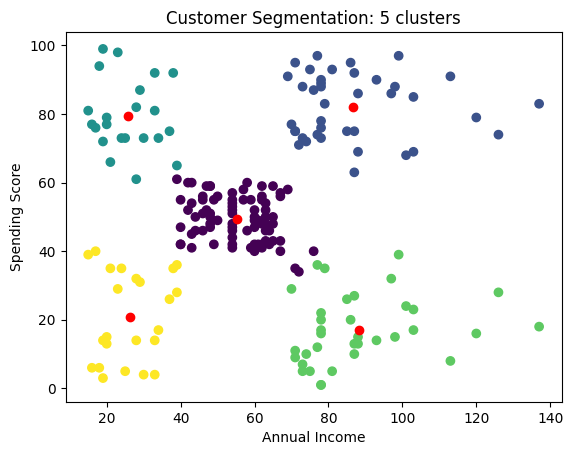

   Annual Income (k$)  Spending Score (1-100)
0           55.296296               49.518519
1           86.538462               82.128205
2           25.727273               79.363636
3           88.200000               17.114286
4           26.304348               20.913043


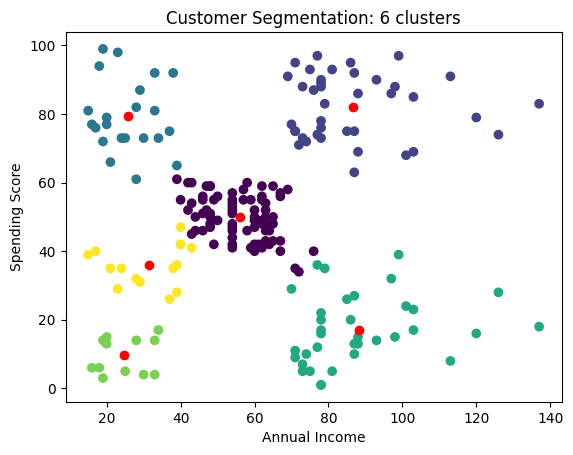

   Annual Income (k$)  Spending Score (1-100)
0           56.051948               49.857143
1           86.538462               82.128205
2           25.727273               79.363636
3           88.200000               17.114286
4           24.583333                9.583333
5           31.533333               35.866667


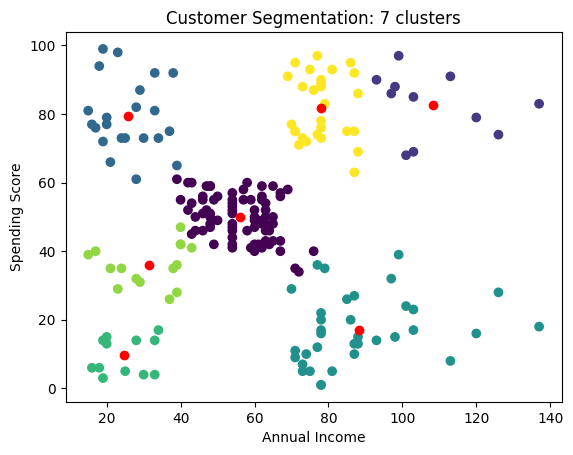

   Annual Income (k$)  Spending Score (1-100)
0           56.051948               49.857143
1          108.181818               82.727273
2           25.727273               79.363636
3           88.200000               17.114286
4           24.583333                9.583333
5           31.533333               35.866667
6           78.035714               81.892857


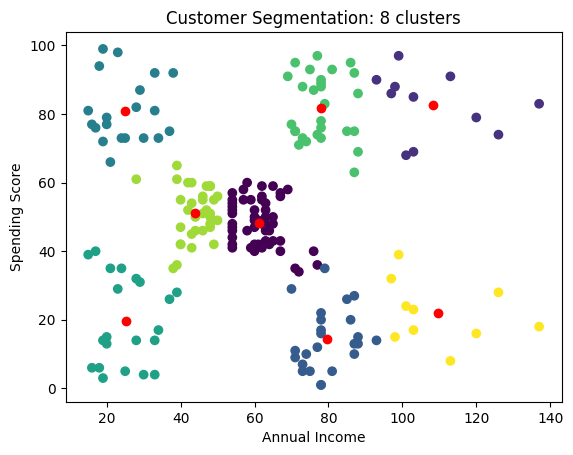

   Annual Income (k$)  Spending Score (1-100)
0           61.301887               48.245283
1          108.181818               82.727273
2           79.708333               14.291667
3           24.950000               81.000000
4           25.142857               19.523810
5           78.035714               81.892857
6           43.969697               51.121212
7          109.700000               22.000000


In [6]:
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# I'll create a function to automate k-means clustering so that I can run it easier with a range of clusters
def run_kmeans_with_clusters(data, features, num_clusters):
    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(features)

    # Run K means
    kmeans = KMeans(n_clusters=num_clusters, random_state= 42)
    kmeans.fit(scaled_data)
    data['Cluster'] = kmeans.fit_predict(scaled_data)

    # Cluster Centers
    cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=data.columns[3:5])

    # Plot Results
    plt.scatter(y=data['Spending Score (1-100)'], x=data['Annual Income (k$)'], c=data['Cluster'], cmap='viridis')
    # Plot cluster center
    for cluster_center in cluster_centers:
        plt.plot(cluster_center[0], cluster_center[1], 'ro', label='Cluster Centers')
    plt.plot()
    plt.title(f'Customer Segmentation: {num_clusters} clusters')
    plt.xlabel('Annual Income')
    plt.ylabel('Spending Score')
    plt.show()

    # Display the cluster centers (in the standardized feature space)
    print(cluster_centers_df)

# Cluster range to run the kmeans clustering on
cluster_number_range = range(2,9)
# run_kmeans_with_clusters(data, features, 5)
for i in cluster_number_range:
    run_kmeans_with_clusters(data, features, i)

### Putting Plots side by side for better comparison

Cluster Centers for --2-- clusters:
   Annual Income (k$)  Spending Score (1-100)
0           52.579618               42.904459
1           89.697674               76.837209
Cluster Centers for --3-- clusters:
   Annual Income (k$)  Spending Score (1-100)
0           87.000000               18.631579
1           86.538462               82.128205
2           44.154472               49.829268
Cluster Centers for --4-- clusters:
   Annual Income (k$)  Spending Score (1-100)
0           48.168317               43.396040
1           86.538462               82.128205
2           25.727273               79.363636
3           87.000000               18.631579
Cluster Centers for --5-- clusters:
   Annual Income (k$)  Spending Score (1-100)
0           55.296296               49.518519
1           86.538462               82.128205
2           25.727273               79.363636
3           88.200000               17.114286
4           26.304348               20.913043
Cluster Centers for --6-- cl

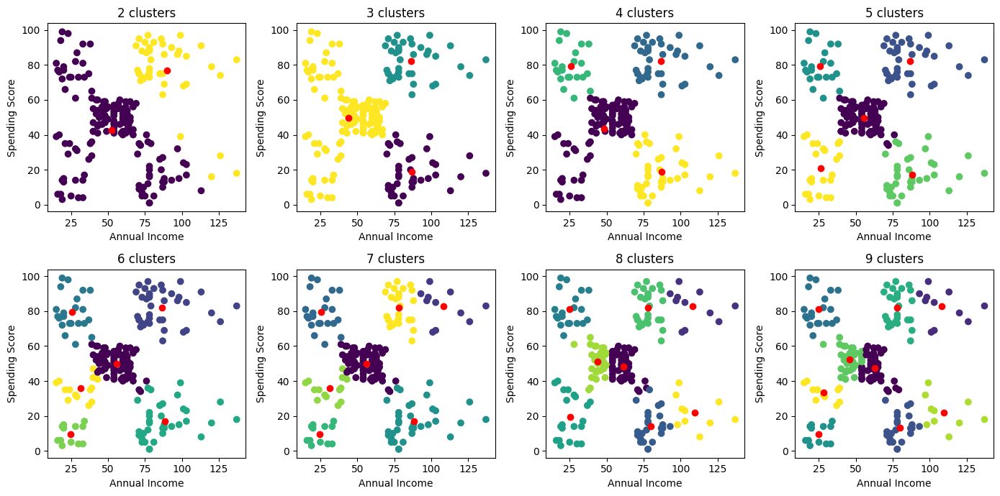

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# I'll create a function to automate k-means clustering so that I can run it easier with a range of clusters
def run_kmeans_with_clusters(data, features, num_clusters, plot_index):
    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(features)

    # Run K means
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(scaled_data)
    data['Cluster'] = kmeans.fit_predict(scaled_data)
    
    # Cluster Centers
    cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=data.columns[3:5])

    # Plot Results
    plt.subplot(2, 4, plot_index) 
    plt.scatter(y=data['Spending Score (1-100)'], x=data['Annual Income (k$)'], c=data['Cluster'], cmap='viridis')
    
    # Plot cluster center
    for cluster_center in cluster_centers:
        plt.plot(cluster_center[0], cluster_center[1], 'ro', label='Cluster Centers')

    plt.title(f'{num_clusters} clusters')
    plt.xlabel('Annual Income')
    plt.ylabel('Spending Score')

    # Display the cluster centers (in the standardized feature space)
    print(f"Cluster Centers for --{num_clusters}-- clusters:")
    print(cluster_centers_df)

# Cluster range to run the kmeans clustering on
cluster_number_range = range(2, 10)

plt.figure(figsize=(14, 7))  # Adjust figure size as needed
plot_index = 1
for i in cluster_number_range:
    run_kmeans_with_clusters(data, features, i, plot_index)
    plot_index += 1

plt.tight_layout()
plt.show()


## Analysis
It looks like we're missing customer segments with cluster numbers of 2, 3, and 4. 
When we get to cluster number of 5, we begin to see distinct customer segments that visually make sense. Here are the clusters:

1. Low Income and Low Spending
2. Low Income and High Spending
3. Middle Income and Middle Spending
4. High Income and Low Spending
5. High Income and High Spending

There might be some value in the finer clustering you get. I'm mainly focused on Very High Income and High Spending section. More on this later. 

I'll run elbow and silouhette next to see if they confirm our observation here and "optimal" cluster number we got here. 

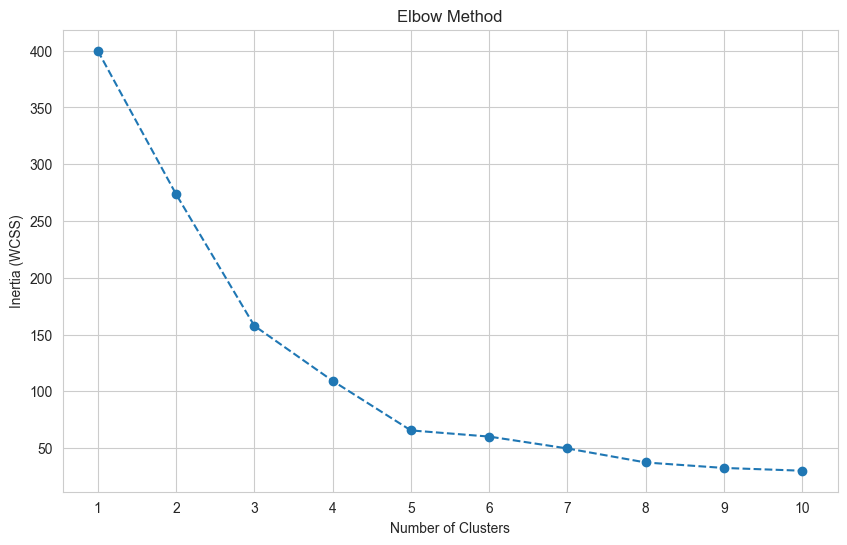

In [166]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Calculate the sum of squared distances for different values of k
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()


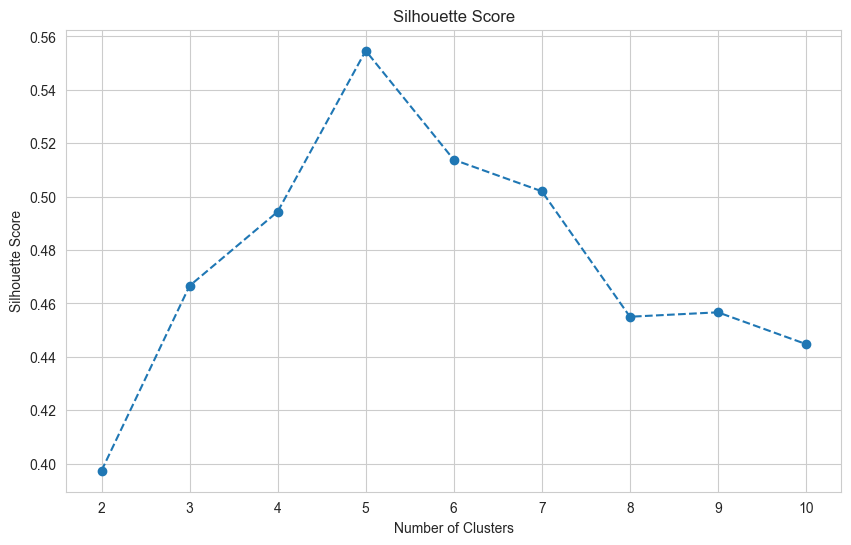

In [163]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Calculate silhouette score for different values of k
silhouette_scores = []
for k in range(2, 11):  # Minimum of 2 clusters required for silhouette score
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(scaled_data, labels))

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()


### Analysis of Elbow and Silhouette Method

- **Elbow Method**: There is an "elbow" point in the plot of the sum of squared distances (inertia) versus the number of clusters. The elbow point represents the number of clusters where adding more clusters does not significantly reduce the inertia. The "elbow" point is 5 matching my initial findings. 

- **Silhouette Score**: I have computed and graphed the silhouette score for each clustering solution. The silhouette score measures how similar an object is to its own cluster compared to other clusters. Higher silhouette scores indicate better-defined clusters. Again, using this method we can confirm the number 5 as it is the point with the highest value. 

It's very interesting that these two methods have also given us an indication that the five main clusters are as follows:

1. Low Income and Low Spending
2. Low Income and High Spending
3. Middle Income and Middle Spending
4. High Income and Low Spending
5. High Income and High Spending

These clusters make sense given the features we have selected. One can see that these clusters would be broken down into finer distinctions, (like Low Income, Low Spending, and middle aged) or (High Income, Low Spending, middle aged and female); so on and so forth, adding more dimension for each feature we select. 

As far the business case goes, there might be value in breaking these down to more categories that can be targeted with specific ads. For example, (High Spending, High Income, middle aged and Male) might be interested in set of products or 'toys' that are different from their Female counterparts. I will discuss this more in later sections. 

#### 3. Advanced Implementation of Hierarchical Clustering
I'll run a Dendrogram on the numerical data to create a Hierarchical clustering using linkage library. 

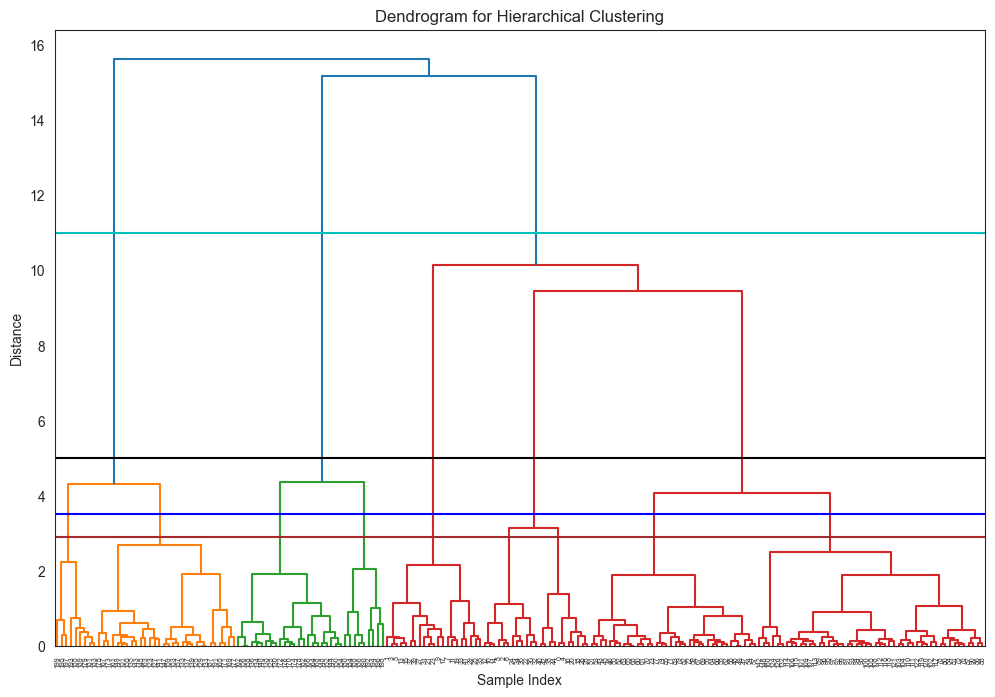

In [21]:
from sklearn.preprocessing import StandardScaler

# Extracting the numerical features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Perform Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
sns.set_style('white')

# Plot the dendrogram for visualization
plt.figure(figsize=(12, 8))
dendrogram(Z, leaf_rotation=90, leaf_font_size=5)

# Drawing a horizontal line to intercept longest vertical line unintercepted by a horizontal line
plt.axhline(y=11, color='c', linestyle='-')
# other clustering options
# Drawing a horizontal line to intercept 8 legs indicating 8 clusters as the next choice
plt.axhline(y=5, color='black', linestyle='-')
# Drawing a horizontal line to intercept 8 legs indicating 8 clusters as the next choice
plt.axhline(y=3.5, color='b', linestyle='-')
# Drawing a horizontal line to intercept 9 legs indicating 9 clusters as the next choice
plt.axhline(y=2.9, color='brown', linestyle='-')

plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

#### Dendrogram Categories
As a rule of thumb we'll have to make a cut in the longest vertical line unintercepted by a horizontal line. This gives us three clusters. The color codes in the graph also show us that we have three main categories: red, green and orange. 

I've also shown places on the grahp where other clustering options could be. 

### Hierarchical Clustering Analysis
The Dendrogram also agrees with earlier conclusions as shown from the cyan line drawn on the graph intercepting the dendrogram 5 times. After these clusters the lines become shorter as finer and finer distinctions are made. I've shown lines crossing legs 8 and 9 times as the next possible choices of finer distinctions. They may still be worth looking into but it still agrees with the main five categories or clusters we've identified so far. 

Interpreting a dendrogram involves understanding the hierarchical structure of the clustering algorithm's results. A dendrogram visually represents how data points are grouped into clusters based on their similarities or distances.

1. **Vertical Lines (Legs)**: The vertical lines in a dendrogram represent individual data points or clusters. Each line starts at a data point or a cluster and ends at the point where it merges with another cluster.

2. **Horizontal Lines (Branches)**: The horizontal lines in a dendrogram represent the distance or dissimilarity between clusters. The longer the horizontal line, the greater the dissimilarity between the clusters it connects.

3. **Cluster Merging**: As you move up the dendrogram, clusters are progressively merged. The height at which two clusters merge corresponds to the distance between them. The taller the point at which two clusters merge, the more dissimilar the clusters are.

4. **Height on the Y-axis**: The height on the y-axis represents the distance or dissimilarity between clusters. Lower points on the y-axis indicate that clusters are more similar, while higher points indicate greater dissimilarity.

5. **Cutting the Dendrogram**: To determine the number of clusters, you can "cut" the dendrogram horizontally at a certain height. The number of vertical lines (legs) crossed by the cut line corresponds to the number of clusters. 5 in our case with the cyan line. However, there's no definitive "correct" way to cut the dendrogram; it depends on the specific context and objectives of our analysis.

6. **Branch Lengths**: The length of the horizontal branches doesn't inherently represent anything meaningful in terms of the original data. However, they are useful for understanding the relative distances between clusters.

7. **Interpretation**: A dendrogram allows you to identify hierarchical relationships between clusters and visualize how they are nested within each other. You can interpret the dendrogram by identifying clusters that are closely related (merged at lower heights) and those that are more distantly related (merged at higher heights).

Example of how the Dendrogram works:
The Dendrogram start by linking very close observations, for example customers 3 (3	4	Female	23	16	77) and 5 (5	6	Female	22	17	76) and forming them into a 'level 2' cluster. Then it merges two other very similar customers 13 (13	14	Female	24	20	77) and 15 (15	16	Male	22	20	79) and merges them into another 'level 2' cluster. It then moves on to merge these two clusters with customer 1. This is repeated until we make more general groupings or clusters. 

## Comprehensive Cluster Analysis Continued
To Further evaluate each clustering method, I'll loop through a range of clusters 3 to 8 and will visulaize the scores and compare clustering method using Silhouette Score, Davies–Bouldin index, and Calinski-Harabasz index. 

These methods are used to evaluate the quality of clustering algorithms and the resulting clusters. They provide quantitative measures to assess how well the data points are clustered and separated from each other. Let's discuss each method:

1. **Silhouette Score**:
   - The silhouette score measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
   - For each data point, the silhouette score ranges from -1 to +1.
   - A high silhouette score indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.
   - The silhouette score for the entire clustering is the average of the silhouette scores of all data points.
   - Higher silhouette scores suggest better clusterings, where clusters are dense and well-separated from each other.

2. **Davies–Bouldin Index**:
   - The Davies–Bouldin index measures the average similarity between each cluster and its most similar cluster, where similarity is defined in terms of both intra-cluster cohesion and inter-cluster separation.
   - It is calculated as the ratio of the sum of the within-cluster distances to the between-cluster distances.
   - Lower values of the Davies–Bouldin index indicate better clustering, with clusters that are compact and well-separated.
   - It is sensitive to the choice of distance metric.

3. **Calinski-Harabasz Index**:
   - The Calinski-Harabasz index, also known as the Variance Ratio Criterion, measures the ratio of between-cluster dispersion to within-cluster dispersion.
   - It is calculated by taking the ratio of the sum of between-cluster dispersion to the sum of within-cluster dispersion.
   - Higher values of the Calinski-Harabasz index indicate better clustering, with clusters that are dense and well-separated.
   - Like the silhouette score, it is affected by the choice of distance metric.

In summary, these methods provide numerical metrics to assess the quality of clustering results. They help in selecting the optimal number of clusters and evaluating the effectiveness of clustering algorithms by considering both the cohesion within clusters and the separation between clusters.

I'll provide graphs below for each method. ***Spoiler alert!*** They all point to 5 as the optimal cluster number. 

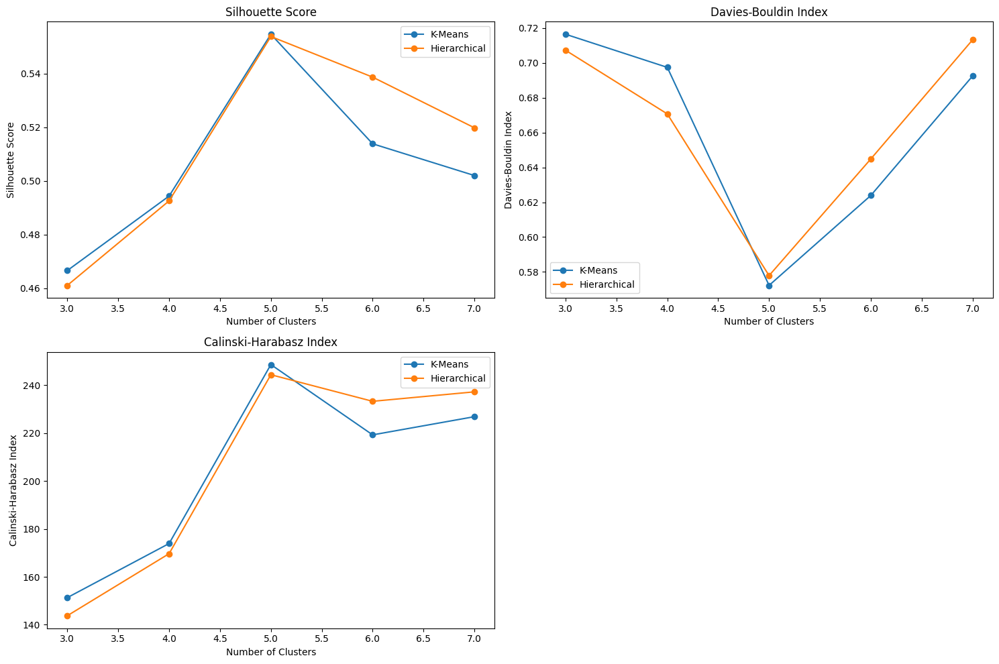

In [29]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

# Define cluster range
cluster_range = range(3, 8)

# Initialize lists to store metrics
silhouette_scores_kmeans = []
davies_bouldin_scores_kmeans = []
calinski_harabasz_scores_kmeans = []
silhouette_scores_hierarchical = []
davies_bouldin_scores_hierarchical = []
calinski_harabasz_scores_hierarchical = []

for n_clusters in cluster_range:
    # Perform K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(scaled_data)

    # Perform Hierarchical Clustering
    Z = linkage(scaled_data, 'ward')
    hierarchical_labels = fcluster(Z, n_clusters, criterion='maxclust')

    # Calculate silhouette score for K-Means
    silhouette_kmeans = silhouette_score(scaled_data, kmeans_labels)
    silhouette_scores_kmeans.append(silhouette_kmeans)

    # Calculate Davies-Bouldin index for K-Means
    db_kmeans = davies_bouldin_score(scaled_data, kmeans_labels)
    davies_bouldin_scores_kmeans.append(db_kmeans)

    # Calculate Calinski-Harabasz index for K-Means
    ch_kmeans = calinski_harabasz_score(scaled_data, kmeans_labels)
    calinski_harabasz_scores_kmeans.append(ch_kmeans)

    # Calculate silhouette score for Hierarchical Clustering
    silhouette_hierarchical = silhouette_score(scaled_data, hierarchical_labels)
    silhouette_scores_hierarchical.append(silhouette_hierarchical)

    # Calculate Davies-Bouldin index for Hierarchical Clustering
    db_hierarchical = davies_bouldin_score(scaled_data, hierarchical_labels)
    davies_bouldin_scores_hierarchical.append(db_hierarchical)

    # Calculate Calinski-Harabasz index for Hierarchical Clustering
    ch_hierarchical = calinski_harabasz_score(scaled_data, hierarchical_labels)
    calinski_harabasz_scores_hierarchical.append(ch_hierarchical)

# Visualization
plt.figure(figsize=(15, 10))

# Plot silhouette scores
plt.subplot(2, 2, 1)
plt.plot(cluster_range, silhouette_scores_kmeans, marker='o', label='K-Means')
plt.plot(cluster_range, silhouette_scores_hierarchical, marker='o', label='Hierarchical')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()

# Plot Davies-Bouldin scores
plt.subplot(2, 2, 2)
plt.plot(cluster_range, davies_bouldin_scores_kmeans, marker='o', label='K-Means')
plt.plot(cluster_range, davies_bouldin_scores_hierarchical, marker='o', label='Hierarchical')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.legend()

# Plot Calinski-Harabasz scores
plt.subplot(2, 2, 3)
plt.plot(cluster_range, calinski_harabasz_scores_kmeans, marker='o', label='K-Means')
plt.plot(cluster_range, calinski_harabasz_scores_hierarchical, marker='o', label='Hierarchical')
plt.title('Calinski-Harabasz Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Calinski-Harabasz Index')
plt.legend()

plt.tight_layout()
plt.show()


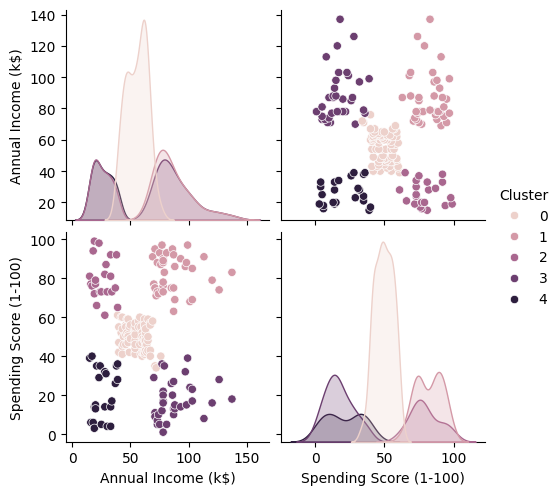

In [32]:
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

k = 5

# Run kmeans with 5 clusters
kmeans = KMeans(n_clusters=k, random_state=42)
data['Cluster'] = kmeans.fit_predict(scaled_data)

sns.pairplot(data, hue='Cluster')

## Extra Credit Assignment (50 points total)

#### Advanced Clustering Techniques (20 points)
- **DBSCAN Clustering**:
  - Implement DBSCAN and compare its segmentation with K-Means and Hierarchical clustering.
  - Analyze the clusters formed by DBSCAN for any unique characteristics.
- **Points**: Quality of implementation and comparative analysis.

#### Dimensionality Reduction Technique (15 points)
- **Principal Component Analysis (PCA)**:
  - Apply PCA to the data and visualize the results.
  - Discuss how dimensionality reduction impacts the clustering results and its potential use in simplifying complex datasets.
- **Points**: Effectiveness of PCA implementation and analysis of its impact.

#### Real-world Application Scenario (15 points)
- **Scenario Development and Justification**:
  - Develop a detailed business scenario utilizing the clustered data.
  - Justify how the chosen segmentation and dimensionality reduction techniques can provide strategic insights in this scenario.
- **Points**: Creativity and practicality in scenario development and justification of techniques.

## DBSCAN Clustering
### DBSCAN and Other Methods of Clustering: Comparison

**DBSCAN (Density-Based Spatial Clustering of Applications with Noise):**
- DBSCAN is a density-based clustering algorithm that groups together closely packed points based on two parameters: ***epsilon (ε)*** and ***minimum points (MinPts)***.
- It defines clusters as dense regions of points separated by regions of lower density. It does not assume any particular cluster shape.
- Each point is classified as a core point, border point, or noise point (outlier) based on the density of points in its neighborhood.
- Core points are those with at least MinPts points within ε distance, border points are reachable from core points but have fewer than MinPts points within ε distance, and noise points have no core points within ε distance.
- DBSCAN does not require specifying the number of clusters beforehand and is robust to noise and outliers.

**HDBSCAN (Hierarchical Density-Based Spatial Clustering of Applications with Noise):**
- HDBSCAN is an extension of DBSCAN that automatically determines the number of clusters.
- It builds a hierarchical tree of clusters using mutual reachability distance and minimum spanning tree concepts.
- The algorithm generates a condensed tree representing the cluster hierarchy and then extracts clusters from this tree based on a specified ***minimum cluster size***.
- HDBSCAN is particularly useful when the density of clusters varies across the dataset and when the number of clusters is unknown or variable.

**Comparison with Hierarchical and K-means Clustering:**

1. **Hierarchical Clustering:**
   - Hierarchical clustering builds a tree-like structure of clusters, where each node represents a cluster and the root node represents the entire dataset.
   - It can be agglomerative (bottom-up) or divisive (top-down).
   - Hierarchical clustering does not require specifying the number of clusters beforehand and provides a hierarchical representation of cluster relationships.
   - However, it can be computationally expensive, especially for large datasets, and may not be suitable for high-dimensional data.

2. **K-means Clustering:**
   - K-means clustering partitions the data into a predetermined number of clusters (K) by iteratively assigning data points to the nearest cluster centroid and updating centroids.
   - It assumes that clusters are isotropic and convex and works well with spherical clusters.
   - K-means requires specifying the number of clusters beforehand and may struggle with non-linear or irregularly shaped clusters.
   - It is computationally efficient and scalable, making it suitable for large datasets.

**Key Differences:**
- DBSCAN and HDBSCAN are density-based clustering algorithms that do not require specifying the number of clusters beforehand and are robust to noise and outliers.
- Hierarchical clustering provides a hierarchical representation of clusters, while K-means partitions the data into a predetermined number of clusters.
- DBSCAN and HDBSCAN are suitable for datasets with varying cluster densities and irregularly shaped clusters, while K-means may perform better with well-separated, spherical clusters.

In summary, DBSCAN and HDBSCAN are advantageous for their ability to automatically determine cluster shapes and sizes and their robustness to noise, while hierarchical and K-means clustering provide alternative approaches with their own strengths and weaknesses. The choice of algorithm depends on the characteristics of the data and the specific objectives of the clustering analysis.

I'll run DBSCAN and HDBSCAN below and play around with the parameters manually to test them out on the dataset.  

[ 0  1  2  3  4  5  6 -1]


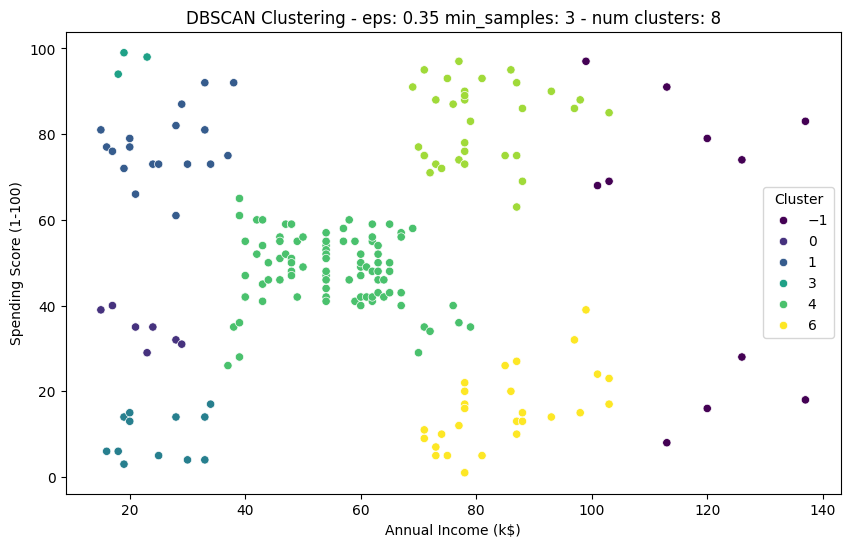

In [34]:
# Initial Implementation of DBSCAN 
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
eps = 0.35
min_samples = 3
# Initialize and fit DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(scaled_data)

# Assign cluster labels
data['Cluster'] = dbscan.labels_
print(data['Cluster'].unique())
# Plot clusters
plt.figure(figsize=(10, 6))
# plt.scatter(x=data['Annual Income (k$)'], y=data['Spending Score (1-100)'], c=data['Cluster'], cmap='viridis')
sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Cluster', palette='viridis')
plt.title(f'DBSCAN Clustering - eps: {eps} min_samples: {min_samples} - num clusters: {len(data['Cluster'].unique())}')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.show()


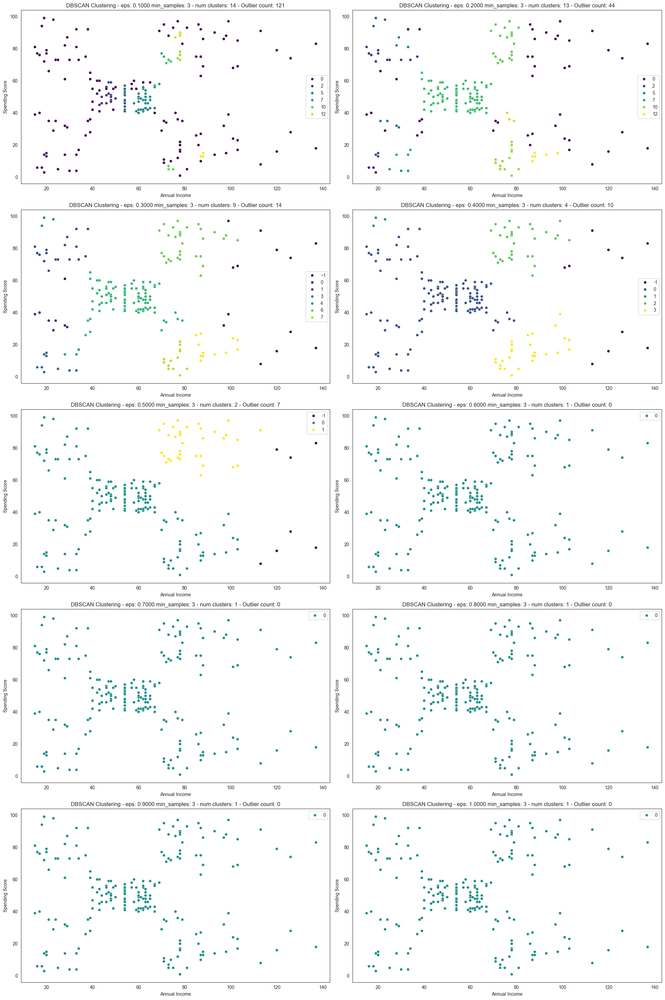

In [197]:
# I'll go ahead and try different epsilon values and graph the results to show how changing epsilon, changes the clustering
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

def run_DBSCAN_and_plot(data, features, eps, min_samples=3, plot_index=1):
    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(features)

    # Initialize and fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(scaled_data)

    # Assign cluster labels
    data['Cluster'] = dbscan.labels_
    outlier_count = len(data[data.Cluster==-1])
    number_of_clusters = len(data['Cluster'].unique()) -1 if outlier_count > 0 else len(data['Cluster'].unique())

    # Plot Results
    plt.subplot(5, 2, plot_index) 
    # plt.scatter(y=data['Spending Score (1-100)'], x=data['Annual Income (k$)'], c=data['Cluster'], cmap='viridis')
    sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Cluster', palette='viridis')

    plt.title(f'DBSCAN Clustering - eps: {eps:.4f} min_samples: {min_samples} - num clusters: {number_of_clusters} - Outlier count: {outlier_count}')
    plt.xlabel('Annual Income')
    plt.ylabel('Spending Score')
    plt.legend()

    return eps, min_samples, number_of_clusters, outlier_count

eps_range = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
min_samples=3
results_pd = pd.DataFrame(columns=["eps",'min_samples','number_of_clusters', "outlier_count"])
# Plot DBSCAN for epsilon range
plt.figure(figsize=(20, 30))
plot_index = 1
for i,eps in enumerate(eps_range):
    results = run_DBSCAN_and_plot(data, features, eps, min_samples, plot_index)
    results_pd.add({"eps":results[0],'min_samples':results[1] ,'number_of_clusters':results[2], "outlier_count":results[3]})
    results_pd.loc[i] = [results[0], results[1], results[2], results[3]]
    plot_index += 1

plt.tight_layout()
plt.show()

In [90]:
results_pd

,eps,min_samples,number_of_clusters,outlier_count
0,0.1,3.0,14.0,121.0
1,0.2,3.0,13.0,44.0
2,0.3,3.0,9.0,14.0
3,0.4,3.0,4.0,10.0
4,0.5,3.0,2.0,7.0
5,0.6,3.0,1.0,0.0
6,0.7,3.0,1.0,0.0
7,0.8,3.0,1.0,0.0
8,0.9,3.0,1.0,0.0
9,1.0,3.0,1.0,0.0


### Refining eps range
Based on the graphs above, it looks like DBSCAN is very sensitive to epsilon and some tuning is required. From the graphs we see that maybe the sweet spot is somewhere between 0.3 and 0.4.
Let's zoom in to that area next.

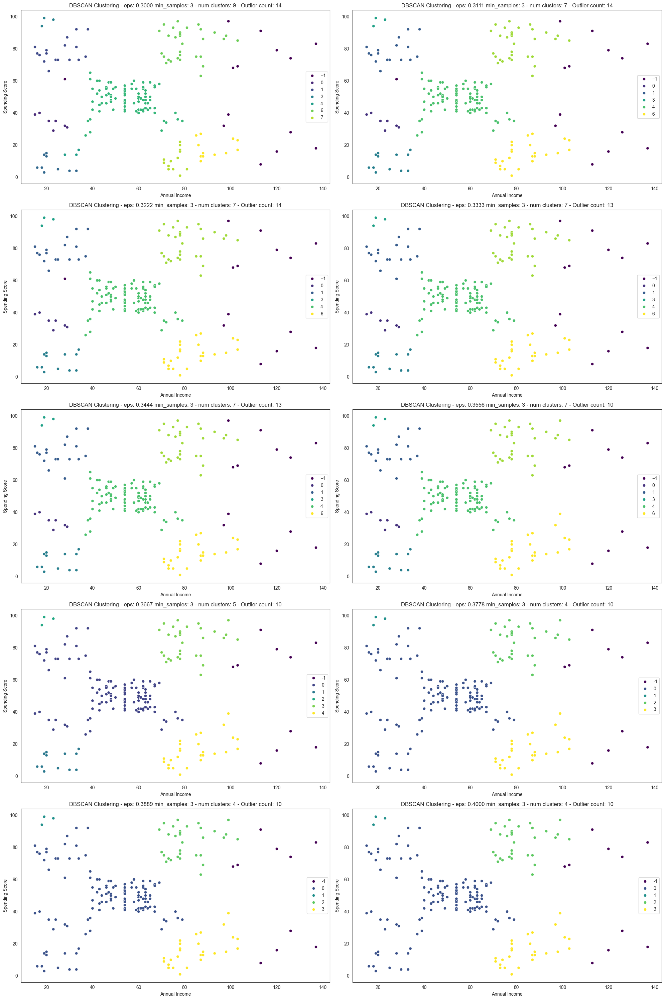

In [204]:
# I'll go ahead and try different epsilon values and graph the results to show how changing epsilon, changes the clustering
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

eps_range = np.linspace(0.3, 0.4, 10, dtype=float)
min_samples=3
results_pd = pd.DataFrame(columns=["eps", 'min_samples', 'number_of_clusters', "outlier_count"])
# Plot DBSCAN for epsilon range
plt.figure(figsize=(20, 30))
plot_index = 1
for i,eps in enumerate(eps_range):
    results = run_DBSCAN_and_plot(data, features, eps, min_samples, plot_index)
    results_pd.add({"eps":results[0],'min_samples':results[1] ,'number_of_clusters':results[2], "outlier_count":results[3]})
    results_pd.loc[i] = [results[0], results[1], results[2], results[3]]
    plot_index += 1

plt.tight_layout()
plt.show()

In [205]:
results_pd

,eps,min_samples,number_of_clusters,outlier_count
0,0.300000,3.0,9.0,14.0
1,0.311111,3.0,7.0,14.0
2,0.322222,3.0,7.0,14.0
3,0.333333,3.0,7.0,13.0
4,0.344444,3.0,7.0,13.0
5,0.355556,3.0,7.0,10.0
6,0.366667,3.0,5.0,10.0
7,0.377778,3.0,4.0,10.0
8,0.388889,3.0,4.0,10.0
9,0.400000,3.0,4.0,10.0


Analysis of the results above
After refining the epsilon range, we can see that on most of the iterations, two very important clusters are labeled outliers. These two groups are: 
1. High income low spenders (HILS)
2. High income high spenders (HIHS)

This may not be ideal.

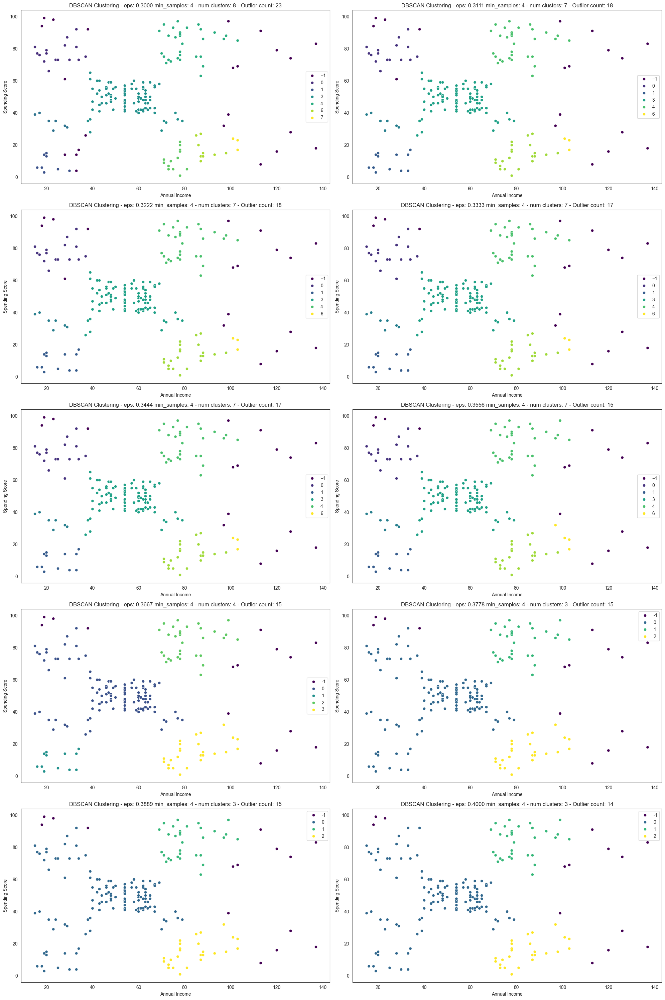

In [202]:
# I'll go ahead and try different epsilon values and graph the results to show how changing epsilon, changes the clustering
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

eps_range = np.linspace(0.3, 0.4, 10, dtype=float)

min_samples=4
results_pd = pd.DataFrame(columns=["eps", 'min_samples', 'number_of_clusters', "outlier_count"])
# Plot DBSCAN for epsilon range
plt.figure(figsize=(20, 30))
plot_index = 1
for i,eps in enumerate(eps_range):
    results = run_DBSCAN_and_plot(data, features, eps, min_samples, plot_index)
    results_pd.add({"eps":results[0],'min_samples':results[1] ,'number_of_clusters':results[2], "outlier_count":results[3]})
    results_pd.loc[i] = [results[0], results[1], results[2], results[3]]
    plot_index += 1

plt.tight_layout()
plt.show()

In [203]:
results_pd

,eps,min_samples,number_of_clusters,outlier_count
0,0.300000,4.0,8.0,23.0
1,0.311111,4.0,7.0,18.0
2,0.322222,4.0,7.0,18.0
3,0.333333,4.0,7.0,17.0
4,0.344444,4.0,7.0,17.0
5,0.355556,4.0,7.0,15.0
6,0.366667,4.0,4.0,15.0
7,0.377778,4.0,3.0,15.0
8,0.388889,4.0,3.0,15.0
9,0.400000,4.0,3.0,14.0


## DBSCAN Tuning
- **Strategy:** To reduce the number of outliers and improve the quality of clusters, I'll run a series of DBScans with min_samples and eps values and will evaluate the result. 

eps range   = [0.3, 0.311, 0.322, 0.33, 0.34, 0.356, 0.367, 0.378, 0.389, 0.4]
min_samples = [3, 4, 5, 6, 7, 8]

A dataframe is provided below summarizing the results. I will also provide ways of visually detecting best parameters. I will pick one that is the union of following characteristics: 
- Low outlier count
- good cluster quality (as per Silhouette score)

In [34]:
from sklearn.metrics import silhouette_score

# Perform DBSCAN clustering
def perform_dbScan_clustering(data, features, eps, min_samples):
    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(features)

    # Initialize and fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(scaled_data)

    # Assign cluster labels
    data['Cluster'] = dbscan.labels_
    silhouette_avg = silhouette_score(scaled_data, dbscan.labels_)

    # Calculate outlier and cluster counts
    outlier_count = len(data[data.Cluster==-1])
    number_of_clusters = len(data['Cluster'].unique()) -1 if outlier_count > 0 else len(data['Cluster'].unique())
    
    return eps, min_samples, number_of_clusters, outlier_count, dbscan.labels_, silhouette_avg

def run_dbScan_range(data, features, min_samples_range, eps_range):
    results_list = []
    # Plot DBSCAN for epsilon range
    for i,eps in enumerate(eps_range):
        for j, min_samples in enumerate(min_samples_range):
            results = perform_dbScan_clustering(data, features, eps, min_samples)
            results_list.append([results[0], results[1], results[2], results[3], results[5]])

    
    results_pd = pd.DataFrame(columns=["eps",'min_samples','number_of_clusters', "outlier_count", "silhouette_score"], data=results_list)
    return results_pd

def plot_results():
    pass

eps_range = np.linspace(0.3, 0.4, 10, dtype=float)
min_samples_range = np.linspace(3, 8, 6, dtype=int)

# Read in the data
data = pd.read_csv('Mall_Customers.csv')
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

results_pd = run_dbScan_range(data, features, min_samples_range, eps_range)
results_pd

,eps,min_samples,number_of_clusters,outlier_count,silhouette_score
0,0.300000,3,9,14,0.413619
1,0.300000,4,8,23,0.384280
2,0.300000,5,7,35,0.316141
3,0.300000,6,6,48,0.249835
4,0.300000,7,4,72,0.231465
5,0.300000,8,5,72,0.194321
6,0.311111,3,7,14,0.464718
7,0.311111,4,7,18,0.415009
8,0.311111,5,6,28,0.403694
9,0.311111,6,5,47,0.288897


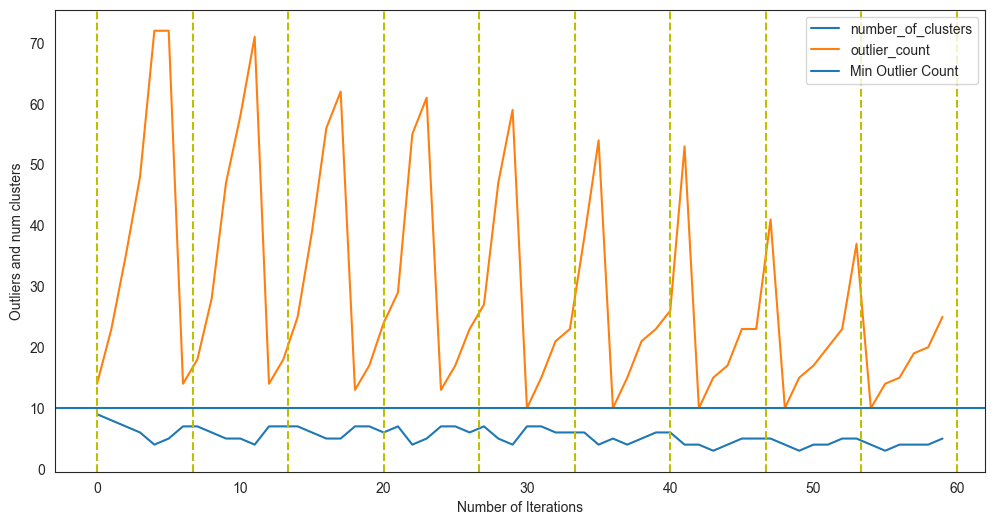

In [270]:
# Let's plot the 
plt.figure(figsize=(12, 6))
plt.plot(results_pd.index, results_pd['number_of_clusters'], label='number_of_clusters')
plt.plot(results_pd.index, results_pd['outlier_count'], label='outlier_count')
plt.axhline(10, linestyle='-', label='Min Outlier Count')

# draw regions where epsilon remained the same but number of min samples varied from 3 to 8
for x in np.linspace(0,len(results_pd), len(eps_range)):
    plt.axvline(x, color="y", linestyle='dashed')

plt.xlabel('Number of Iterations')
plt.ylabel('Outliers and num clusters')
plt.legend()
plt.show()

The graph above shows as the number of min_samples and epsilon grows, the number of outliers goes down. 

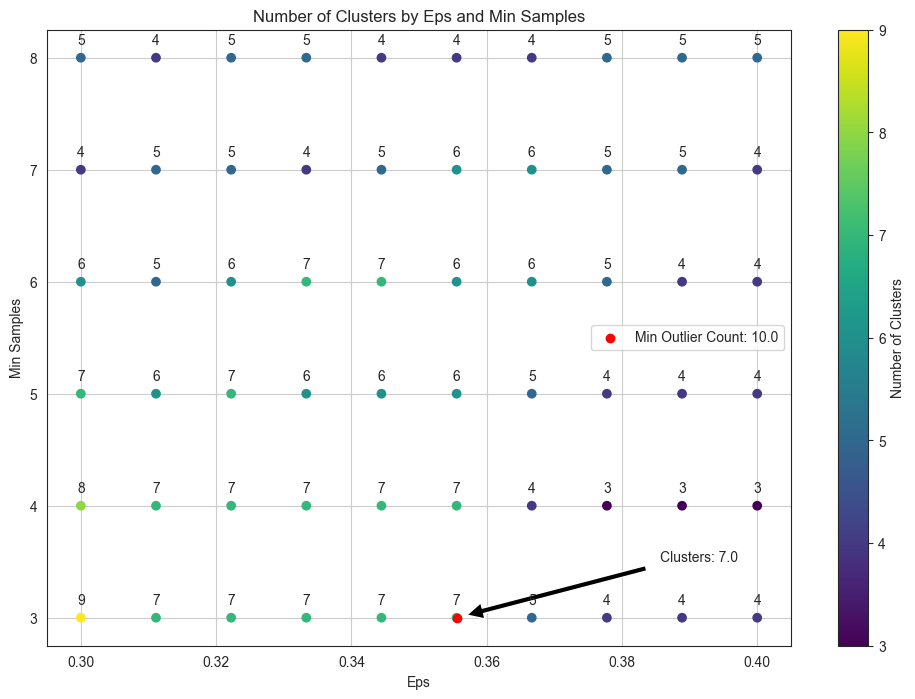

In [266]:
# Find the row where outlier count is minimum
min_outlier_row = results_pd.loc[results_pd['outlier_count'].idxmin()]

# Extract relevant data
min_eps = min_outlier_row['eps']
min_min_samples = min_outlier_row['min_samples']
min_num_clusters = min_outlier_row['number_of_clusters']
min_outlier_count = min_outlier_row['outlier_count']

# Plot
plt.figure(figsize=(12, 8))
plt.scatter(results_pd['eps'], results_pd['min_samples'], c=results_pd['number_of_clusters'], cmap='viridis')
plt.colorbar(label='Number of Clusters')
plt.scatter(min_eps, min_min_samples, color='red', label=f'Min Outlier Count: {min_outlier_count}')
plt.xlabel('Eps')
plt.ylabel('Min Samples')
plt.title('Number of Clusters by Eps and Min Samples')
# # Annotate red dot with cluster count
# plt.annotate(f'Clusters: {min_num_clusters}', (min_eps, min_min_samples), xytext=(min_eps + 0.05, min_min_samples + 0.5),
#              arrowprops=dict(facecolor='black', shrink=0.05))

# Annotate red dot with cluster count to the left
plt.annotate(f'Clusters: {min_num_clusters}', (min_eps, min_min_samples), xytext=(min_eps + 0.03, min_min_samples+0.5),
             arrowprops=dict(facecolor='black', shrink=0.05))
# Annotate each dot with cluster count
for i, txt in enumerate(results_pd['number_of_clusters']):
    plt.annotate(txt, (results_pd['eps'][i], results_pd['min_samples'][i]), textcoords="offset points", xytext=(0,10), ha='center')

plt.legend()
plt.grid(True)
plt.show()


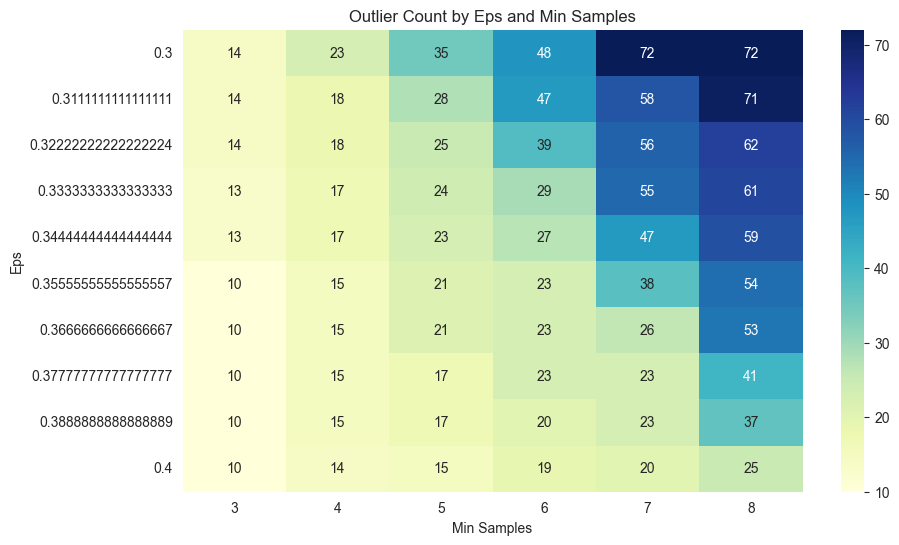

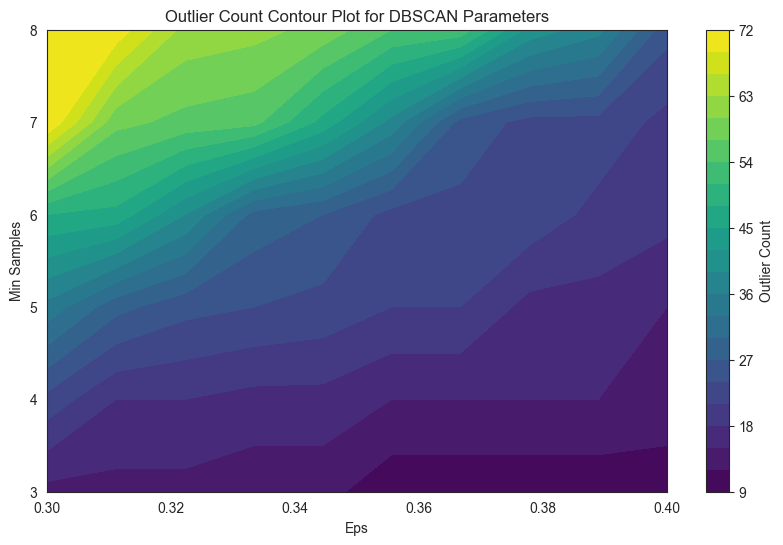

In [272]:
import seaborn as sns

# Visualize outlier count with a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(results_pd.pivot_table(index='eps', columns='min_samples', values='outlier_count'), annot=True, cmap='YlGnBu')
plt.title('Outlier Count by Eps and Min Samples')
plt.xlabel('Min Samples')
plt.ylabel('Eps')
plt.show()

from scipy.interpolate import griddata

# Generate grid points for eps and min_samples
eps_grid, min_samples_grid = np.meshgrid(eps_range, min_samples_range)

# Interpolate outlier counts on the grid
outlier_count_grid = griddata((results_pd['eps'], results_pd['min_samples']), results_pd['outlier_count'], (eps_grid, min_samples_grid), method='linear')

# Plot contour plot
plt.figure(figsize=(10, 6))
contour = plt.contourf(eps_grid, min_samples_grid, outlier_count_grid, levels=20, cmap='viridis')
plt.colorbar(contour, label='Outlier Count')
plt.xlabel('Eps')
plt.ylabel('Min Samples')
plt.title('Outlier Count Contour Plot for DBSCAN Parameters')
plt.grid(True)
plt.show()


To choose the right parameters for DBSCAN clustering algorithm while minimizing the number of outliers, we can analyze the results obtained from running the algorithm with different parameter combinations. Here's a strategy one can follow based on business objectives:

1. **Evaluate Outlier Count**: Look at the `outlier_count` column in your `results_pd` DataFrame. This column represents the number of outliers detected by DBSCAN for each combination of `eps` and `min_samples`. If we have too many outliers we are losing potential leads which is not good for business. 

2. **Identify Low Outlier Count Configurations**: Identify parameter combinations (i.e., `eps` and `min_samples`) that result in low outlier counts. These configurations indicate settings where DBSCAN was able to group most of the data points into clusters, leaving fewer points classified as outliers. The outlier count at minimum is 10. This happens at min sample number of 3. 

3. **Visualize the Results**: You can visualize the `outlier_count` against the parameter combinations (`eps` and `min_samples`) using a heatmap or contour plot. This visualization can provide insights into how the outlier count varies with different parameter settings. Both heatmap and contour plot are provided above. 

4. **Select Optimal Parameters**: We'd want to choose parameter combinations that yield a low outlier count while still producing a reasonable number of clusters. We may need to strike a balance between minimizing outliers and maximizing cluster quality.

The heatmap above is showing the outlier count for different combinations of `eps` and `min_samples`. Lower outlier counts are represented by lighter colors.

After analyzing the heatmap and considering the outlier count along with other factors such as the number of clusters and cluster quality, one can select the optimal parameters for DBSCAN clustering algorithm.

#### Running DBSCAN with the best parameters found in the previous step 
Silhouette score can be misleading here perhaps if the number of outliers are alot. In addition I don't think we prefer to have a lot of outliers and lose customers that can be targeted, or catered to. 

Based on the information presented on the heatmap, and the results datafram, I can see that there are a few options with the minimum outlier count of 10. I'll pick one from this range the one that has the highest Silhouette score and meaningful number of clusters.

I'll show this below. 

In [40]:
lowest_outliers = results_pd[results_pd['outlier_count']<=10]
lowest_outliers

,eps,min_samples,number_of_clusters,outlier_count,silhouette_score
30,0.355556,3,7,10,0.481003
36,0.366667,3,5,10,0.388704
42,0.377778,3,4,10,0.362691
48,0.388889,3,4,10,0.362691
54,0.400000,3,4,10,0.362691


In [41]:
best_option = lowest_outliers[lowest_outliers['silhouette_score']==lowest_outliers['silhouette_score'].max()]
best_option

,eps,min_samples,number_of_clusters,outlier_count,silhouette_score
30,0.355556,3,7,10,0.481003


## DBSCAN Parameter Tuning - Conclusion
OK. It looks like we have something we can go with. I'll run a DBSCAN below with these parameters. This is shown in the output of the previous cell. eps = 0.355556, min_samples= 3

Silhouette Score : 0.48


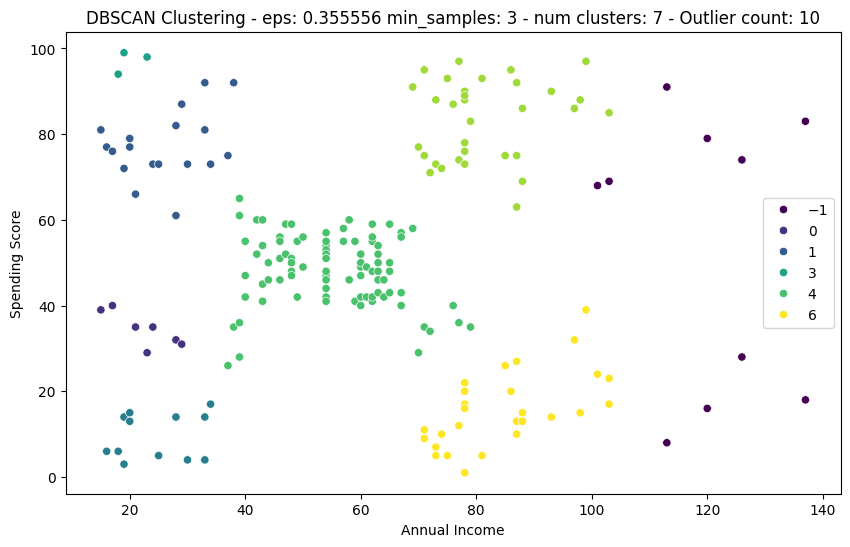

In [42]:
# Running HDBSCAN Algorithm With the best parameters
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

data = pd.read_csv('Mall_Customers.csv')
# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Initialize and fit DBSCAN
dbscan = DBSCAN(eps=0.355556, min_samples=3)
dbscan.fit(scaled_data)

# Assign cluster labels
data['Cluster'] = dbscan.labels_
outlier_count = len(data[data.Cluster==-1])
number_of_clusters = len(data['Cluster'].unique()) -1 if outlier_count > 0 else len(data['Cluster'].unique())

# Calculate silhouette score for K-Means
silhouette_score = silhouette_score(scaled_data, dbscan.labels_)

print(f'Silhouette Score : {silhouette_score:.2f}')
# Plot Results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Annual Income (k$)', y='Spending Score (1-100)', hue='Cluster', palette='viridis')
plt.title(f'DBSCAN Clustering - eps: 0.355556 min_samples: 3 - num clusters: {number_of_clusters} - Outlier count: {outlier_count}')
plt.xlabel('Annual Income')
plt.ylabel('Spending Score')
plt.legend()


I think I'll stick with k-means clustering for the purposes of this assignment. Although I can see that DBSCAN can find clusters based on density as opposed to proximity and that can be advantagous in some datasets and contexts. One can use this clustering alongside kmeans and tune it to see if it provides additional value and meaningful clusters. 

It has classified ***high income low spenders*** and ***high income high spenders*** as outliers as shown by the -1 cluster label. Which is probably not a desired business outcome. 

#### Dimensionality Reduction Technique (15 points)
- **Principal Component Analysis (PCA)**:
  - Apply PCA to the data and visualize the results.
  - Discuss how dimensionality reduction impacts the clustering results and its potential use in simplifying complex datasets.

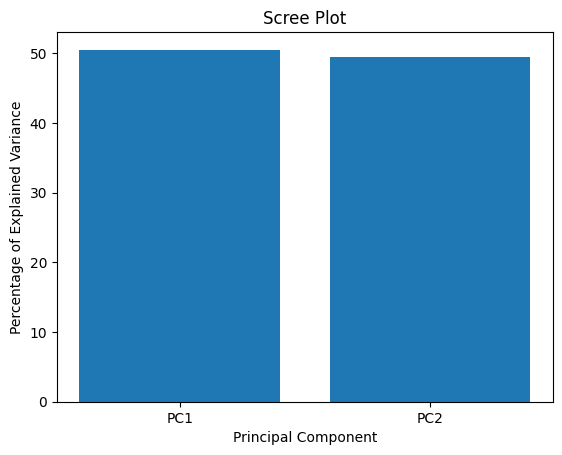

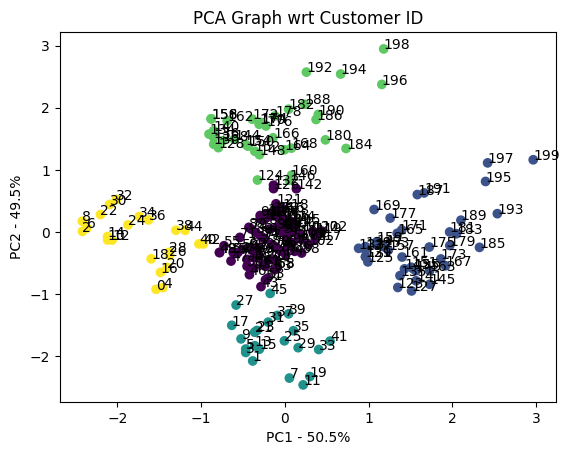

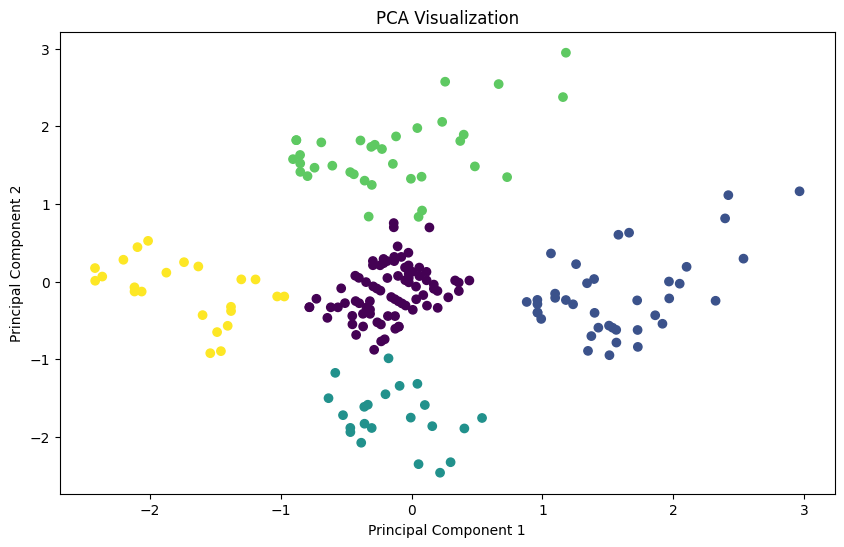

0    0.707107
1    0.707107
dtype: float64


,PC1,PC2
0,-1.537109,-0.922207
1,-0.384168,-2.075149
2,-2.416002,0.010665
3,-0.466982,-1.938355
4,-1.455678,-0.895678
...,...,...
195,2.394866,0.813689
196,1.156805,2.375629
197,2.419550,1.112883
198,1.179183,2.947027


In [11]:
# Perform PCA
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the original dataset
data = pd.read_csv("Mall_Customers.csv")

# Select relevant features for clustering
features = data[['Annual Income (k$)', 'Spending Score (1-100)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
scaled_df = pd.DataFrame(scaled_data, columns=features.columns)

# --------------- Run k-means clustering ---------------
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state= 42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)

# --------------- Perform PCA ---------------
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
pca_result = pca.fit_transform(scaled_data)

# Get variance as percentage for each principle component
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC'+str(x) for x in range(1, len(per_var)+1)]

# Do a bar graph or scree graph of principle  
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

# Create a DataFrame with the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
plt.scatter(pca_df.PC1, pca_df.PC2, c=data['Cluster'])
plt.title('PCA Graph wrt Customer ID')
plt.xlabel('PC1 - {0}%'.format(per_var[0]))
plt.ylabel('PC2 - {0}%'.format(per_var[1]))
 
for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))
 
plt.show()

# Visualize the PCA results
plt.figure(figsize=(10, 6))
plt.scatter(x=pca_df['PC1'], y=pca_df['PC2'], c=data['Cluster'])
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

loading_scores = pd.Series(pca.components_[0])
## now sort the loading scores based on their magnitude
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
 
# get the names of the top 10 genes
top_10_cust = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_cust])
pca_df


# Business Case and Feature Engineering
Let's remember why we're doing this to begin with by repeating a paragraph from the beginning of this assignment:
- **Significance of Customer Segmentation**:
  - **Targeted Marketing**: Tailoring marketing campaigns to specific customer groups based on their purchasing behavior and preferences.
  - **Product Customization**: Developing products and services that cater to the specific needs and desires of different customer segments. 
  - **Improved Customer Experience**: Delivering personalized experiences to customers, increasing satisfaction and loyalty.

Depending on how many features we select, we can break down the dataset into the following groups:
1. Low Income and Low Spending
2. Low Income and High Spending
3. Middle Income and Middle Spending
4. High Income and Low Spending
5. High Income and High Spending

For each one of the main categories above, one can further look into breaking these categories down into the following: 
- Female
    - Young
    - Middle Aged
    - Old
- Male
    - Young
    - Middle Aged
    - Old

There might be value in breaking these down to more categories that can be targeted with specific ads. For example, (High Spending, High Income, middle aged and Male) might be interested in set of products or 'toys' that are different from their Female counterparts.

We could offer credit cards with cash back that both rewards loyal customers and incentivises preferred spending at our preferred institutions. This could be marketed to High Spending category as they would see the benefits of an already established behavior (high spending) with this product. 

You could also customize products for some of these categories. For example, maybe High Income, Low Spending Young and Middle Aged cluster is not spending money because they believe in saving money. We could customize an investment service/product that would suit this cluster. 

To improve customer experience and increase loyalty, we could perhaps focus on High Income High Spending cluster and offer them loyalty points. Or offer Cash Back programs as mentioned above. 

For example if we want to capture new customers for our checking account service, we can go ahead and focus more on young adults that are less likely to have already opened an account somewhere else. Those would be young adults of perhaps age range of 18 - 20 for example.  <br/><br/> 
Or if the product is investment services, we can target those adults that are more likely to have surplus income. This could be determined by age or by a relationship between annual income and spending score. Higher the spending score (assuming spending score is derived from "Mall" spending category) lower the probability of having money left for investment. Maybe they are people who believe in saving money but haven't yet figured out how to invest.
 <br/><br/> 
### Feature Engineering
- #### Numerical
    1. **Spent Income**:
    - This is how much each customer spends based on spending score. Assuming that spending score is somewhat of a "spending efficiency"
    - Formula: spending_score/100*annual_income
     <br/><br/> 
    2. **Left Over Income or un-spent Income**: 
    - This is how much income is left for each customer solely based on spending score. 
    - Formula: (100 - Spending score)/100 * Annual Income
 <br/><br/> 
    3. **Spending Score / Age**: 
    - Spending efficiency over age 
    - Formula: Spending Efficiency / Age
 <br/><br/> 
- #### Categorical:
    1. **Age Range**:
    - I will divide the Age feature into several age groups or ranges as follows: 
        - **Very Young Adults** (18-20)
        - **Young Adults** (20-30)
        - **Middle-aged Adults** (31-50)
        - **Older Adults** (51-70)
        - **Seniors** (71+)
 <br/><br/> 
    2. **Income Range**:
    - Similarly, I will categorize Annual Income into income brackets or ranges:
        - **Low Income** (< $40,000)
        - **Middle Income Low** ($40,000 - $70,000)        
        - **Middle Income High** ($70,000 - $100,000)
        - **High Income** (> $100,000)
    - Again, income ranges could be better grouped based on the context of business and the purchasing power of our target market.
 <br/><br/> 
    3. **Gender Age Range**:
    - This is useful because Male and Female of certain age range are interested in different products. For example, men of certain age would like to buy 'toys' and women of certain age might be interested in other categories of products. This creates a segment that might be useful in targeted marketing. 
    - will encode based on the union of age range and gender


By engineering categorical features from Age and Income, I can create discrete groups that can capture different customer segments with varying characteristics and preferences. These categorical features can be used in conjunction with clustering algorithms to partition the data into meaningful clusters. Additionally, they can facilitate targeted marketing efforts, personalized product recommendations, and tailored customer experiences based on the unique needs of each segment. Let's see how well they work out. 

In [10]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
# Load the original dataset
data = pd.read_csv("Mall_Customers.csv")
data


,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [11]:
data['Spent Income (k$)']       = (data['Spending Score (1-100)']/100.0)*data['Annual Income (k$)']
data['Unspent Income (k$)']     = (100-data['Spending Score (1-100)'])/100.0*data['Annual Income (k$)']
data['spending_score_by_age']   = data['Spending Score (1-100)'] / data['Age']
data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age
0,1,Male,19,15,39,5.85,9.15,2.052632
1,2,Male,21,15,81,12.15,2.85,3.857143
2,3,Female,20,16,6,0.96,15.04,0.300000
3,4,Female,23,16,77,12.32,3.68,3.347826
4,5,Female,31,17,40,6.80,10.20,1.290323
...,...,...,...,...,...,...,...,...
195,196,Female,35,120,79,94.80,25.20,2.257143
196,197,Female,45,126,28,35.28,90.72,0.622222
197,198,Male,32,126,74,93.24,32.76,2.312500
198,199,Male,32,137,18,24.66,112.34,0.562500


In [12]:
label_encoder = LabelEncoder()
data['Gender'] = label_encoder.fit_transform(data['Gender'])
data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age
0,1,1,19,15,39,5.85,9.15,2.052632
1,2,1,21,15,81,12.15,2.85,3.857143
2,3,0,20,16,6,0.96,15.04,0.300000
3,4,0,23,16,77,12.32,3.68,3.347826
4,5,0,31,17,40,6.80,10.20,1.290323
...,...,...,...,...,...,...,...,...
195,196,0,35,120,79,94.80,25.20,2.257143
196,197,0,45,126,28,35.28,90.72,0.622222
197,198,1,32,126,74,93.24,32.76,2.312500
198,199,1,32,137,18,24.66,112.34,0.562500


In [13]:
age_bins    = [18, 20, 30, 50, 70, 90]
age_labels  = [0, 1, 2, 3, 4]
data['Age Range']   = pd.cut(data['Age'], bins=age_bins, labels=age_labels, include_lowest=True)
data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age,Age Range
0,1,1,19,15,39,5.85,9.15,2.052632,0
1,2,1,21,15,81,12.15,2.85,3.857143,1
2,3,0,20,16,6,0.96,15.04,0.300000,0
3,4,0,23,16,77,12.32,3.68,3.347826,1
4,5,0,31,17,40,6.80,10.20,1.290323,2
...,...,...,...,...,...,...,...,...,...
195,196,0,35,120,79,94.80,25.20,2.257143,2
196,197,0,45,126,28,35.28,90.72,0.622222,2
197,198,1,32,126,74,93.24,32.76,2.312500,2
198,199,1,32,137,18,24.66,112.34,0.562500,2


In [14]:
income_bins     = [0, 40, 70, 100, 200]
income_labels   = [0, 1, 2, 3]
data['Income Range']   = pd.cut(data['Annual Income (k$)'], bins=income_bins, labels=income_labels, include_lowest=True)
data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age,Age Range,Income Range
0,1,1,19,15,39,5.85,9.15,2.052632,0,0
1,2,1,21,15,81,12.15,2.85,3.857143,1,0
2,3,0,20,16,6,0.96,15.04,0.300000,0,0
3,4,0,23,16,77,12.32,3.68,3.347826,1,0
4,5,0,31,17,40,6.80,10.20,1.290323,2,0
...,...,...,...,...,...,...,...,...,...,...
195,196,0,35,120,79,94.80,25.20,2.257143,2,3
196,197,0,45,126,28,35.28,90.72,0.622222,2,3
197,198,1,32,126,74,93.24,32.76,2.312500,2,3
198,199,1,32,137,18,24.66,112.34,0.562500,2,3


In [15]:
data.columns

Index(['CustomerID', 'Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)',
       'spending_score_by_age', 'Age Range', 'Income Range'],
      dtype='object')

In [16]:
data.describe()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,100.500000,0.440000,38.850000,60.560000,50.200000,30.467950,30.092050,1.553611
std,57.879185,0.497633,13.969007,26.264721,25.823522,22.912533,22.644037,1.080741
min,1.000000,0.000000,18.000000,15.000000,1.000000,0.570000,0.190000,0.027027
25%,50.750000,0.000000,28.750000,41.500000,34.750000,16.550000,16.337500,0.709804
50%,100.500000,0.000000,36.000000,61.500000,50.000000,25.265000,24.900000,1.170284
75%,150.250000,1.000000,49.000000,78.000000,73.000000,34.040000,34.155000,2.422932
max,200.000000,1.000000,70.000000,137.000000,99.000000,113.710000,112.340000,5.111111


In [17]:
data.to_csv('Mall_Customers_E_Features_01.csv')

In [18]:
data_c = data.drop(columns=['CustomerID'])
correlation_matrix = data_c.corr()
correlation_matrix

,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age,Age Range,Income Range
Gender,1.000000,0.060867,0.056410,-0.058109,-0.017633,0.083272,-0.040770,-0.009924,0.082300
Age,0.060867,1.000000,-0.012398,-0.327227,-0.196914,0.184869,-0.676222,0.893961,-0.002537
Annual Income (k$),0.056410,-0.012398,1.000000,0.009903,0.583315,0.569665,-0.085337,0.050103,0.943883
Spending Score (1-100),-0.058109,-0.327227,0.009903,1.000000,0.736964,-0.734216,0.860762,-0.247282,0.003355
Spent Income (k$),-0.017633,-0.196914,0.583315,0.736964,1.000000,-0.335273,0.540031,-0.107082,0.541688
Unspent Income (k$),0.083272,0.184869,0.569665,-0.734216,-0.335273,1.000000,-0.645416,0.166466,0.546695
spending_score_by_age,-0.040770,-0.676222,-0.085337,0.860762,0.540031,-0.645416,1.000000,-0.615466,-0.099259
Age Range,-0.009924,0.893961,0.050103,-0.247282,-0.107082,0.166466,-0.615466,1.000000,0.068514
Income Range,0.082300,-0.002537,0.943883,0.003355,0.541688,0.546695,-0.099259,0.068514,1.000000


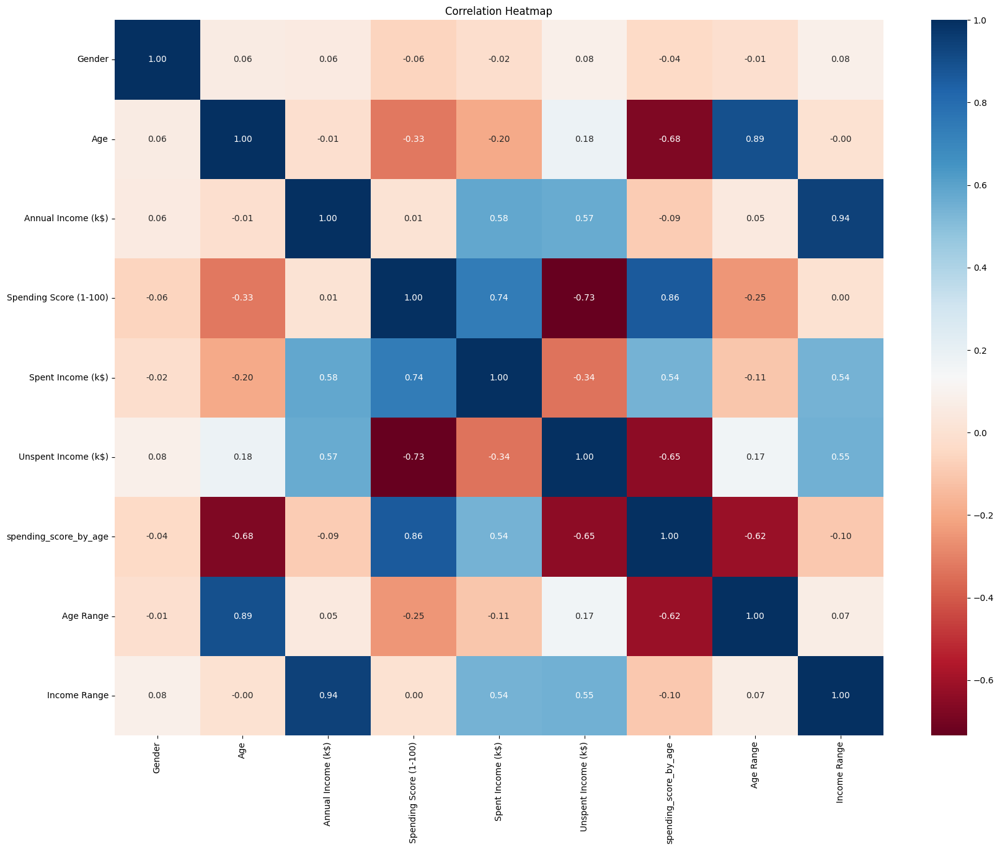

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap="RdBu", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

### Some Observations From heatmap
**Age**<br></br>
It looks like there is a negative correlation between Age and: 
- Spending Score, (older people spend / buy less)
- Spent Income, (Older people keep more of their income) and
- Spending Score by Age (Older people)

**Annual Income**<br></br>
It also looks like that Annual Income has a positive correlation with both: 
- Spent Income (more likely to spend income if income is high)
- Unspent Income (more likely to save income if income is high)

**Spending Score**<br></br>
- Gender: there's a slight negative correlation with respect to gender. This means that women are slightly more likely to have a better spending score. This is shown in the means calculated per gender below. 

**Redundant Features**<br></br>
Annual Income and Income range both have very similar correlation values to the rest of the values. One of these features might be redundant. 

Very similar deal with Age range and Age. 

So out of 5 features we engineered, only three might have a meaningful impact: spent income, un-spent income, spending score by age. Let's see what the effect of that is below. 

In [20]:
male_spending_score_mean = data['Spending Score (1-100)'][data['Gender']==1].mean()
female_spending_score_mean = data['Spending Score (1-100)'][data['Gender']==0].mean()

male_annual_income_mean = data['Annual Income (k$)'][data['Gender']==1].mean()
female_annual_income_mean = data['Annual Income (k$)'][data['Gender']==0].mean()

male_spent_income_mean = data['Spent Income (k$)'][data['Gender']==1].mean()
female_spent_income_mean = data['Spent Income (k$)'][data['Gender']==0].mean()

male_unspent_income_mean = data['Unspent Income (k$)'][data['Gender']==1].mean()
female_unspent_income_mean = data['Unspent Income (k$)'][data['Gender']==0].mean()

# Print the Gender Related Means
print(f"Male Spending Score Mean: {male_spending_score_mean:.2f}\nFemale Spending Score Mean: {female_spending_score_mean:.2f}\n")
print(f"Male Annual Income mean: {male_annual_income_mean:.2f}\nFemale Annual Income Mean: {female_annual_income_mean:.2f}\n")
print(f"Male Spent Income mean: {male_spent_income_mean:.2f}\nFemale Spent Income Mean: {female_spent_income_mean:.2f}\n")
print(f"Male Un-Spent Income mean: {male_unspent_income_mean:.2f}\nFemale Un-Spent Income Mean: {female_unspent_income_mean:.2f}\n")

Male Spending Score Mean: 48.51
Female Spending Score Mean: 51.53

Male Annual Income mean: 62.23
Female Annual Income Mean: 59.25

Male Spent Income mean: 30.01
Female Spent Income Mean: 30.83

Male Un-Spent Income mean: 32.21
Female Un-Spent Income Mean: 28.42



Gender doesn't seem to have very strong correlation to other features. From this dataset alone I doubt that we can make useful segmentations and clusters based on gender. I'll get into what features are actually making a difference in clustering a bit later on in the notebook. 

### Hierarchical Clustering with Engineered Features
Let's run a Hierarchical Clustering and see how many clusters we come up with the engineered features.

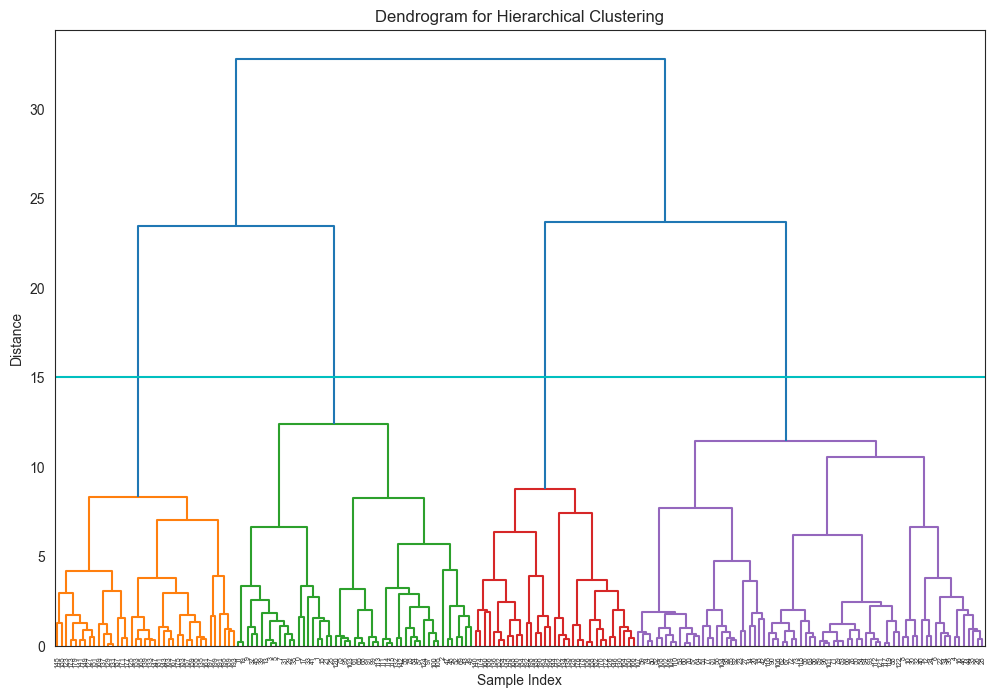

In [25]:
from scipy.cluster.hierarchy import dendrogram, linkage
# # Select relevant features for clustering
features = data[['Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)',
       'spending_score_by_age', 'Age Range', 'Income Range']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Perform Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
sns.set_style('white')

# Plot the dendrogram for visualization
plt.figure(figsize=(12, 8))
dendrogram(Z, leaf_rotation=90, leaf_font_size=5)

# Drawing a horizontal line to intercept 5 legs indicating 5 clusters 
plt.axhline(y=15, color='c', linestyle='-')
# # Drawing a horizontal line to intercept 8 legs indicating 8 clusters as the next choice
# plt.axhline(y=3.5, color='b', linestyle='-')
# # Drawing a horizontal line to intercept 9 legs indicating 9 clusters as the next choice
# plt.axhline(y=2.9, color='brown', linestyle='-')

plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

#### Dendrogram Categories - With Engineered Features
Let's find the the longest vertical line unintercepted by a horizontal line like we did in the previous dendrogram. 

When I compare this Dendrogram to the original dataset with no features and use the same rule of thumb, I can see that adding more features has resulted in more categories (3 vs 4). Something I expected to see. 

Let's run a kmeans clustering algorithm with this cluster number of 4. 

In [26]:
from sklearn.cluster import KMeans

# Select relevant features for clustering
features = data[['Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)',
       'spending_score_by_age', 'Age Range', 'Income Range']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply KMeans clustering
num_clusters = 4  # This can be adjusted based on experimentation
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)
data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100),Spent Income (k$),Unspent Income (k$),spending_score_by_age,Age Range,Income Range,Cluster
0,1,1,19,15,39,5.85,9.15,2.052632,0,0,2
1,2,1,21,15,81,12.15,2.85,3.857143,1,0,2
2,3,0,20,16,6,0.96,15.04,0.300000,0,0,2
3,4,0,23,16,77,12.32,3.68,3.347826,1,0,2
4,5,0,31,17,40,6.80,10.20,1.290323,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...
195,196,0,35,120,79,94.80,25.20,2.257143,2,3,1
196,197,0,45,126,28,35.28,90.72,0.622222,2,3,3
197,198,1,32,126,74,93.24,32.76,2.312500,2,3,1
198,199,1,32,137,18,24.66,112.34,0.562500,2,3,3


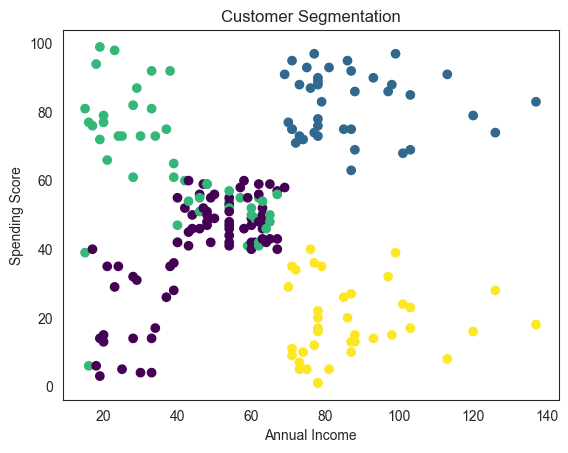

array([[ 0.39189189, 51.05405405, 46.93243243, 41.18918919, 20.95310811,
        25.97932432,  0.83953996,  2.44594595,  0.68918919],
       [ 0.46153846, 32.69230769, 86.53846154, 82.12820513, 71.01410256,
        15.52435897,  2.53948874,  1.66666667,  2.12820513],
       [ 0.42857143, 24.12244898, 39.95918367, 62.87755102, 23.51469388,
        16.4444898 ,  2.66815591,  0.85714286,  0.44897959],
       [ 0.52631579, 40.39473684, 87.        , 18.63157895, 16.34973684,
        70.65026316,  0.49517356,  1.92105263,  2.15789474]])

In [27]:
# Plot the data
plt.scatter(y=data['Spending Score (1-100)'], x=data['Annual Income (k$)'], c=data['Cluster'], cmap='viridis')
plt.title('Customer Segmentation')
plt.xlabel('Annual Income')
plt.ylabel('Spending Score')
plt.show()

# Display the cluster centers (in the standardized feature space)
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers

### K-means of dataset with engineered features
It looks like that 4 clusters may not be the right number of clusters as the graph shows some leakage from the Low income/low spending cluster into middle income/middle spending region. 

Let's run this again with 5 clusters and see how this differs from the original results. 

In [373]:
from sklearn.cluster import KMeans

# Select relevant features for clustering
features = data[['Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)',
       'spending_score_by_age', 'Age Range', 'Income Range']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply KMeans clustering
num_clusters = 5  # This can be adjusted based on experimentation
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)

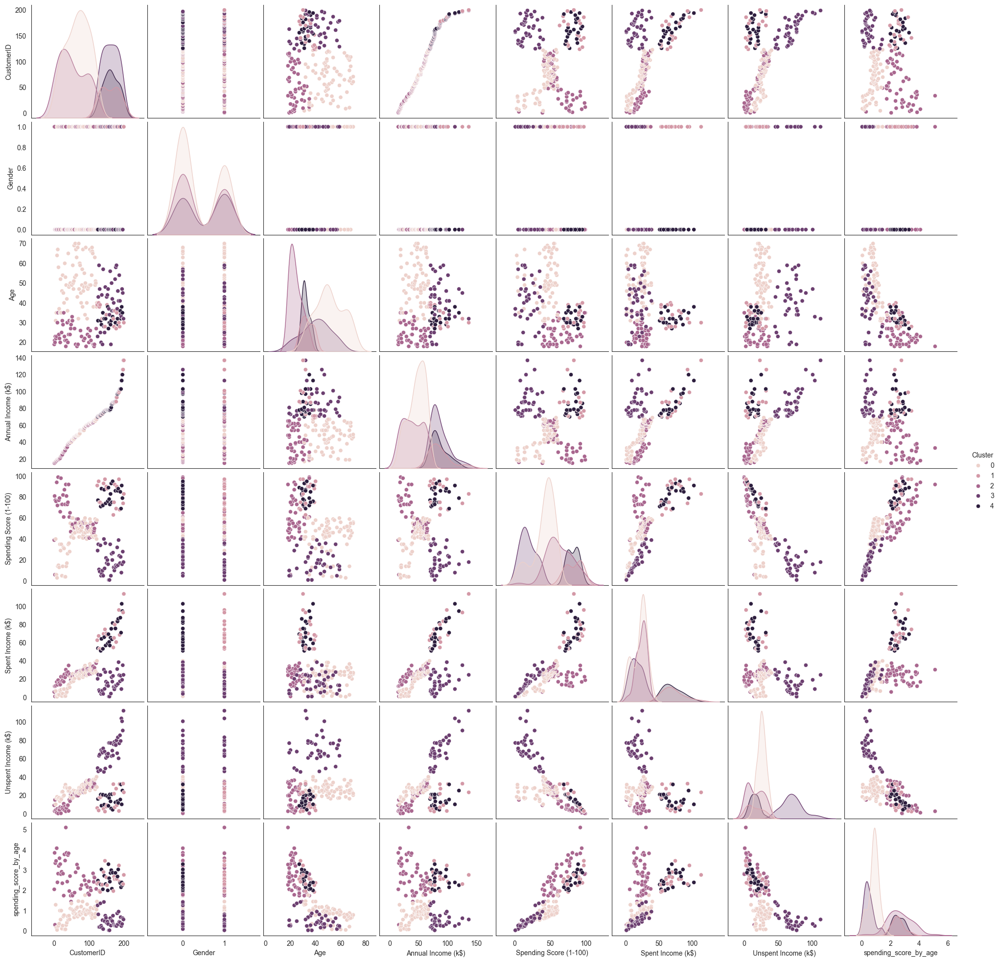

In [56]:
# Let's do a pairplot to visualize the features
sns.pairplot(data, hue='Cluster')

### Analysis of Pairplot of Features and Clusters
The pairplot shows some very nice visualization of the clustering that was done in the previous step. For example we can see some almost distinct clustering on "Unspent Income" vs. "Age" graph that we were not seeing on the "Spending Score" vs. "Annual Income" graph. Similarly one can see from the "Unspent Income" vs. "Annual Income" graph that there's a cluster of customers that have 50% or more Unspent Income in the income range of ~70 and above. 

### Cluster Distribution of Features - Graph

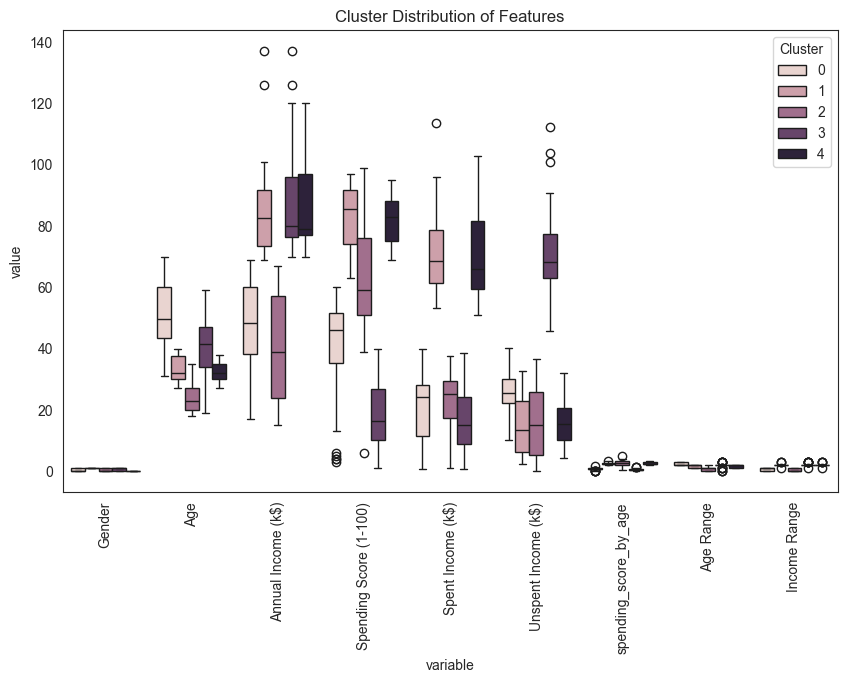

In [59]:
# Melt the dataframe to long format
melted_data = pd.melt(data, id_vars=['Cluster'], value_vars=features)

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='variable', y='value', hue='Cluster', data=melted_data)
plt.xticks(rotation=90)
plt.title('Cluster Distribution of Features')
plt.show()

### Cluster Distribution of Features - Analysis
As was seen earlier with the correlation matrix and heatmap analysis, Cluster Distribution Plot of Features shows that there's barely any variance in the features of ***Gender***, ***spending_score_by_age***, ***Age Range***, and ***Income Range***. 

However the other two engineered feature of ***"Spent Income (k$)"*** and ***"Unspent Income (k$)"*** have shown to be effective in clustering. We can move ahead with that information in mind. 

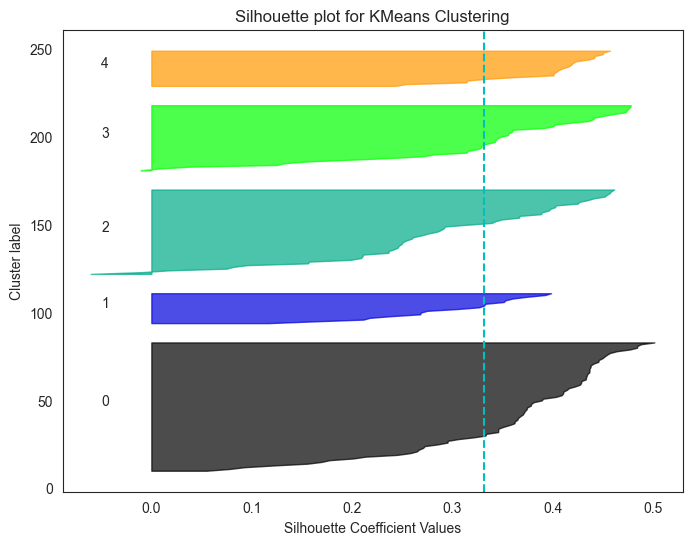

In [374]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import numpy as np

# Compute silhouette scores
silhouette_score = silhouette_score(scaled_data, kmeans.labels_)
sample_silhouette_values = silhouette_samples(scaled_data, kmeans.labels_)

# Plot silhouette scores
plt.figure(figsize=(8, 6))
y_lower = 10
for i in range(num_clusters):
    ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / num_clusters)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10
# Drawing the average silhouette score
plt.axvline(silhouette_score, linestyle='--', c='c')
plt.title("Silhouette plot for KMeans Clustering")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster label")
plt.show()


The silhouette plot is a visual tool for interpreting the quality of clustering results. It provides a graphical representation of how well each data point lies within its cluster.

Here's how to interpret a silhouette plot:

1. **Silhouette Coefficient**: The silhouette coefficient measures how similar a data point is to its own cluster compared to other clusters. It ranges from -1 to 1, where:
   - A coefficient close to +1 indicates that the data point is well-clustered and lies far from the neighboring clusters.
   - A coefficient close to 0 indicates that the data point is close to the decision boundary between two clusters.
   - A coefficient close to -1 indicates that the data point may have been assigned to the wrong cluster.

2. **Silhouette Plot Layout**: In the silhouette plot, each data point is represented by a vertical line. The position of the line represents the silhouette coefficient of the data point. The lines are sorted within each cluster, and the clusters are ordered by their average silhouette coefficient.

3. **Cluster Separation**: The width of the silhouette plot for each cluster gives an indication of the cluster's separation from other clusters. The wider the silhouette plot for a cluster, the better the separation.

4. **Cluster Label**: Each cluster in the plot is labeled with its cluster number.

5. **Overall Silhouette Score**: The silhouette plot often includes an overall silhouette score, which is the average silhouette coefficient over all data points. This score gives an overall measure of how well-separated the clusters are.

Interpreting a silhouette plot involves looking for:
- Consistent and high silhouette coefficients across all clusters, indicating well-defined and distinct clusters.
- Silhouette coefficients that are close to 0 or negative, which suggests that data points may be poorly clustered or assigned to the wrong cluster.

By examining the silhouette plot, you can gain insights into the quality of your clustering results and identify potential issues such as suboptimal cluster separation or misclassification of data points.

None of the clusters identified have a lower than average silhouette score. Therefore we can say that 5 numbers of clusters is an appropriate choice. 

## Use Only the useful Engineered Features and Repeat
I will add the 'useful features' and repeat the analysis. 

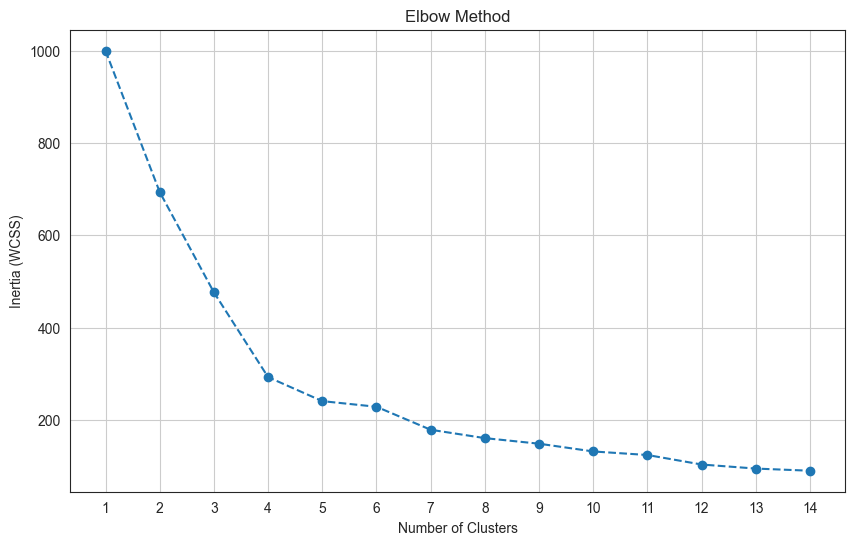

In [68]:
# Select relevant features for clustering
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

cluster_num_max = 15

# Calculate the sum of squared distances for different values of k
wcss = []
for k in range(1, cluster_num_max):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, cluster_num_max), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method')
plt.xticks(range(1, cluster_num_max))
plt.grid(True)
plt.show()

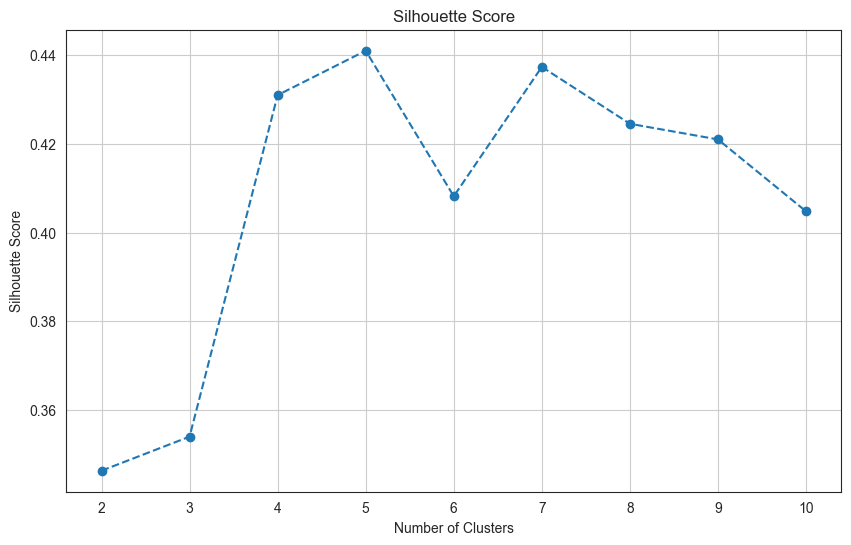

In [69]:
# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Calculate silhouette score for different values of k
silhouette_scores = []
for k in range(2, 11):  # Minimum of 2 clusters required for silhouette score
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(scaled_data, labels))

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

### Running PCA and K-Means of 5 Clusters
```python
# Select relevant features for clustering
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]
```

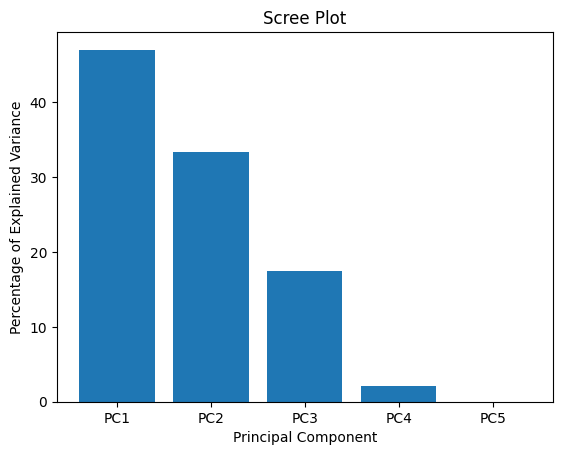

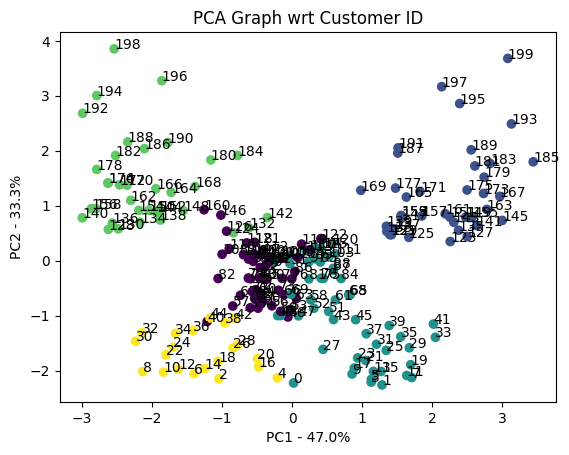

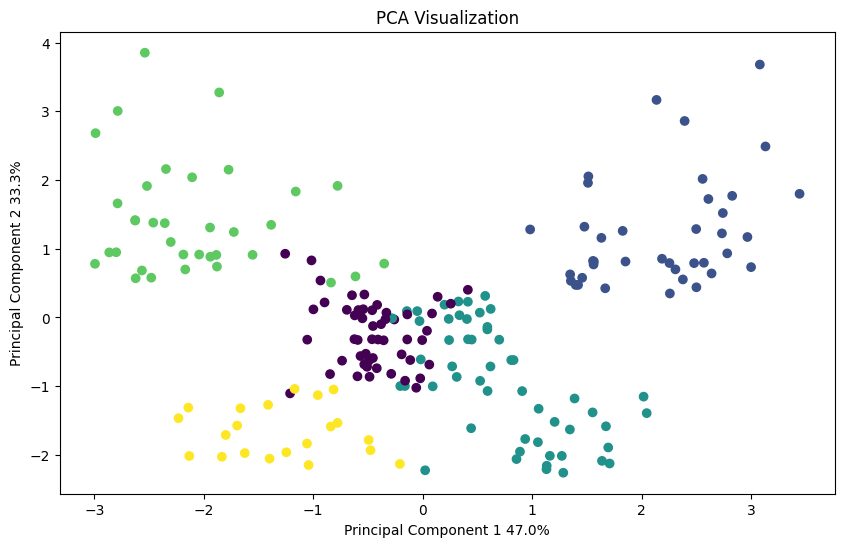

2    0.626635
3    0.517737
4   -0.501286
0   -0.295990
1    0.019476
dtype: float64


,PC1,PC2,PC3,PC4,PC5,Cluster
0,0.022430,-2.224242,1.468906,0.396173,2.985594e-16,2
1,1.284209,-2.259791,1.023045,-0.624016,1.309898e-15,2
2,-1.042349,-2.147640,1.650913,1.163558,-1.191071e-15,4
3,1.130591,-2.208622,0.910614,-0.530632,1.554573e-16,2
4,-0.208445,-2.132020,0.644956,0.285775,1.393450e-16,4
...,...,...,...,...,...,...
195,2.392465,2.859049,-0.523998,0.520603,4.549459e-17,1
196,-1.858574,3.274364,0.137473,-0.480596,1.534347e-16,3
197,2.135897,3.165753,-0.218793,0.509675,1.286264e-16,1
198,-2.537909,3.852423,1.350185,-0.731986,-2.306292e-16,3


In [10]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import numpy as np

data = pd.read_csv('Mall_Customers_E_Features_01.csv')

# Select relevant features for clustering
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
scaled_df = pd.DataFrame(scaled_data, columns=features.columns)

# --------------- Run k-means clustering ---------------
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state= 42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)

# --------------- Perform PCA ---------------
pca = PCA()  
pca_result = pca.fit_transform(scaled_data)

# Get variance as percentage for each principle component
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC'+str(x) for x in range(1, len(per_var)+1)]

# Do a bar graph or scree graph of principle  
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

# Create a DataFrame with the PCA results
# pca_df = pd.DataFrame(data=pca_result, columns=[f"PC1{per_var[0]}%", f"PC1{per_var[1]}%", f"PC1{per_var[2]}%", f"PC1{per_var[3]}%",f"PC1{per_var[4]}%"])
pca_df = pd.DataFrame(data=pca_result, columns=labels)
pca_df['Cluster'] = data['Cluster']
plt.scatter(pca_df.PC1, pca_df.PC2, c=pca_df['Cluster'])
plt.title('PCA Graph wrt Customer ID')
plt.xlabel('PC1 - {0}%'.format(per_var[0]))
plt.ylabel('PC2 - {0}%'.format(per_var[1]))
 
for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))
 
plt.show()

# Visualize the PCA results
plt.figure(figsize=(10, 6))
plt.scatter(x=pca_df['PC1'], y=pca_df['PC2'], c=data['Cluster'])
plt.title('PCA Visualization')
plt.xlabel(f'Principal Component 1 {per_var[0]}%')
plt.ylabel(f'Principal Component 2 {per_var[1]}%')
plt.show()

loading_scores = pd.Series(pca.components_[0])
## now sort the loading scores based on their magnitude
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
 
# get the names of the top 10 genes
top_10_cust = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_cust])

# using what James provided on "Lesson 3 Data Management and Preprocessing" Assignment key to create an interactive 3D plot
import plotly.express as px
# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(pca_df,
                    x=pca_df.PC1,
                    y=pca_df.PC2,
                    z=pca_df.PC3,
                    color='Cluster',
                    title='Interactive 3D Scatter Plot of Principle Components and Clusters')

# Update the layout to adjust the size
fig.update_layout(width=700, height=500)  # You can adjust these values as needed

# Show the plot
fig.show()

pca_df


### Running PCA and K-Means of 7 Clusters
```python
# Select relevant features for clustering
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]
```

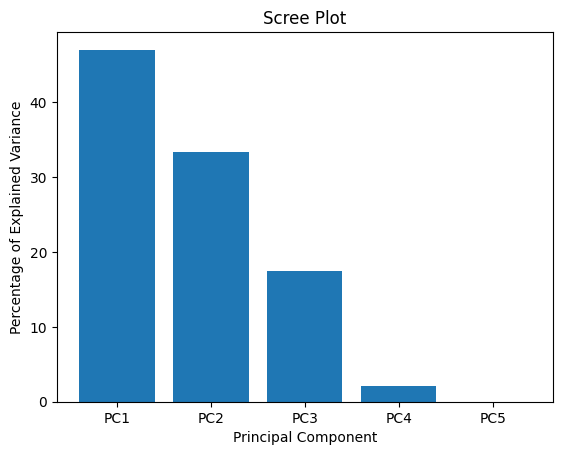

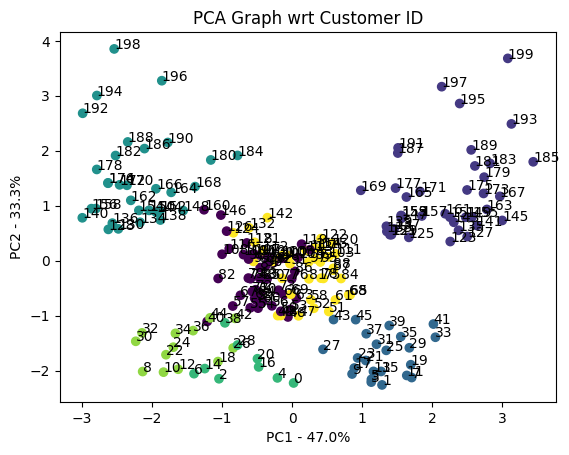

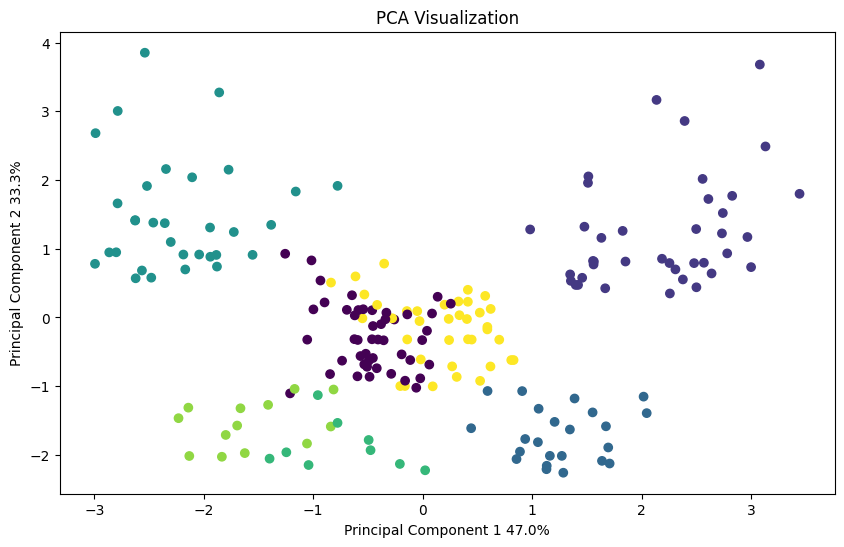

2    0.626635
3    0.517737
4   -0.501286
0   -0.295990
1    0.019476
dtype: float64


,PC1,PC2,PC3,PC4,PC5,Cluster
0,0.022430,-2.224242,1.468906,0.396173,2.985594e-16,4
1,1.284209,-2.259791,1.023045,-0.624016,1.309898e-15,2
2,-1.042349,-2.147640,1.650913,1.163558,-1.191071e-15,4
3,1.130591,-2.208622,0.910614,-0.530632,1.554573e-16,2
4,-0.208445,-2.132020,0.644956,0.285775,1.393450e-16,4
...,...,...,...,...,...,...
195,2.392465,2.859049,-0.523998,0.520603,4.549459e-17,1
196,-1.858574,3.274364,0.137473,-0.480596,1.534347e-16,3
197,2.135897,3.165753,-0.218793,0.509675,1.286264e-16,1
198,-2.537909,3.852423,1.350185,-0.731986,-2.306292e-16,3


In [19]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import numpy as np

data = pd.read_csv('Mall_Customers_E_Features_01.csv')

# Select relevant features for clustering
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)
scaled_df = pd.DataFrame(scaled_data, columns=features.columns)

# --------------- Run k-means clustering ---------------
num_clusters = 7
kmeans = KMeans(n_clusters=num_clusters, random_state= 42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)

# --------------- Perform PCA ---------------
pca = PCA()  
pca_result = pca.fit_transform(scaled_data)

# Get variance as percentage for each principle component
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC'+str(x) for x in range(1, len(per_var)+1)]

# Do a bar graph or scree graph of principle  
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

# Create a DataFrame with the PCA results
# pca_df = pd.DataFrame(data=pca_result, columns=[f"PC1{per_var[0]}%", f"PC1{per_var[1]}%", f"PC1{per_var[2]}%", f"PC1{per_var[3]}%",f"PC1{per_var[4]}%"])
pca_df = pd.DataFrame(data=pca_result, columns=labels)
pca_df['Cluster'] = data['Cluster']
plt.scatter(pca_df.PC1, pca_df.PC2, c=pca_df['Cluster'])
plt.title('PCA Graph wrt Customer ID')
plt.xlabel('PC1 - {0}%'.format(per_var[0]))
plt.ylabel('PC2 - {0}%'.format(per_var[1]))
 
for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))
 
plt.show()

# Visualize the PCA results
plt.figure(figsize=(10, 6))
plt.scatter(x=pca_df['PC1'], y=pca_df['PC2'], c=data['Cluster'])
plt.title('PCA Visualization')
plt.xlabel(f'Principal Component 1 {per_var[0]}%')
plt.ylabel(f'Principal Component 2 {per_var[1]}%')
plt.show()

loading_scores = pd.Series(pca.components_[0])
## now sort the loading scores based on their magnitude
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
 
# get the names of the top 10 genes
top_10_cust = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_cust])

# using what James provided on "Lesson 3 Data Management and Preprocessing" Assignment key to create an interactive 3D plot
import plotly.express as px
# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(pca_df,
                    x=pca_df.PC1,
                    y=pca_df.PC2,
                    z=pca_df.PC3,
                    color='Cluster',
                    title='Interactive 3D Scatter Plot of Principle Components and Clusters')

# Update the layout to adjust the size
fig.update_layout(width=700, height=500)  # You can adjust these values as needed

# Show the plot
fig.show()

pca_df


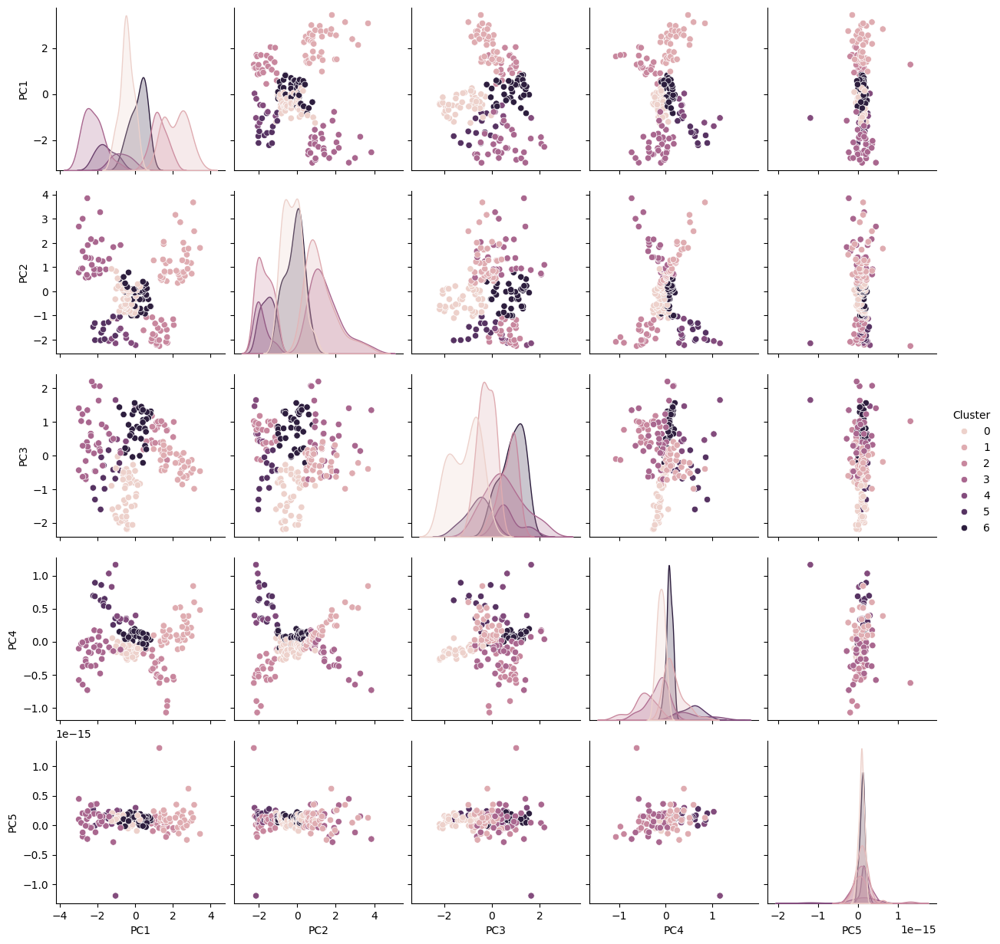

In [20]:
# let's do a pair plot of the pca data and 
import seaborn as sns
sns.pairplot(pca_df, hue='Cluster')

### PCA Analysis
With the features selected it looks like that most of the variance in data is covered by the three principle components, reducing the 5 dimensional feature space to three. 

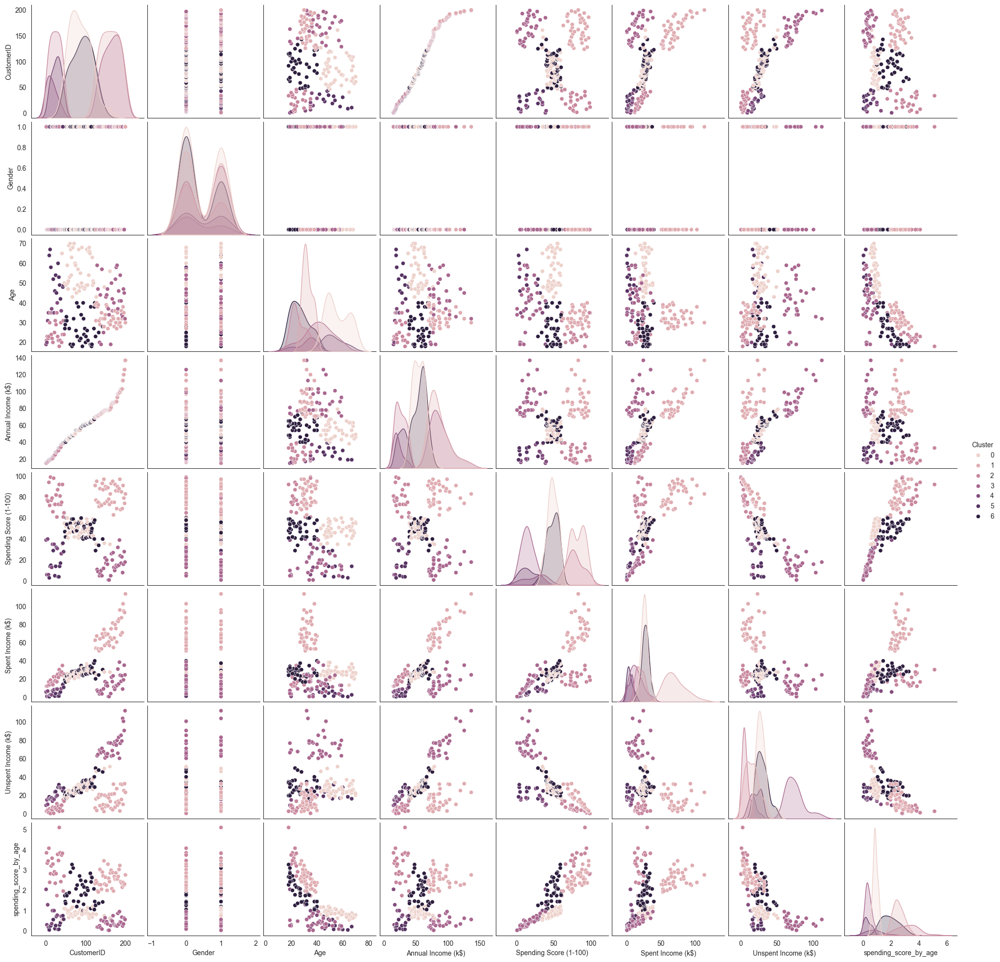

In [366]:
# Let's try this out with cluster number of 7 as the second number of clusters sugggested from the silhoutte method
from sklearn.cluster import KMeans
import pandas as pd

# Select features for PCA (exclude non-numeric columns like CustomerID and Gender)
features = data[['Age', 'Annual Income (k$)',
       'Spending Score (1-100)', 'Spent Income (k$)', 'Unspent Income (k$)']]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply KMeans clustering
num_clusters = 7  # This can be adjusted based on experimentation
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(scaled_data)
data['Cluster'] = kmeans.fit_predict(scaled_data)

# Let's do a pairplot to visualize the features
sns.pairplot(data, hue='Cluster')

## Pairplot Insights - 7 clusters

One of the interesting things that this clustering has done is seperating those who have a high spending score into two groups: those who are spending 60k and above and those who are 40k and below. This could be an important segment for the business. This is shown in "Spent Income" vs. "Spending Score" graph. Businesses can target the high spending group with higher end products they can afford more often than they can for the other group. 

Another interesting thing is young adults of around 30 - 40 years of age have higher amounts of Spent Income, as evident by Age vs Spent Income graph. That's anoher group the business can target. 

Overall I think clustering number of 7 with the added features gives us more insights into our customer base and their spending habits. 

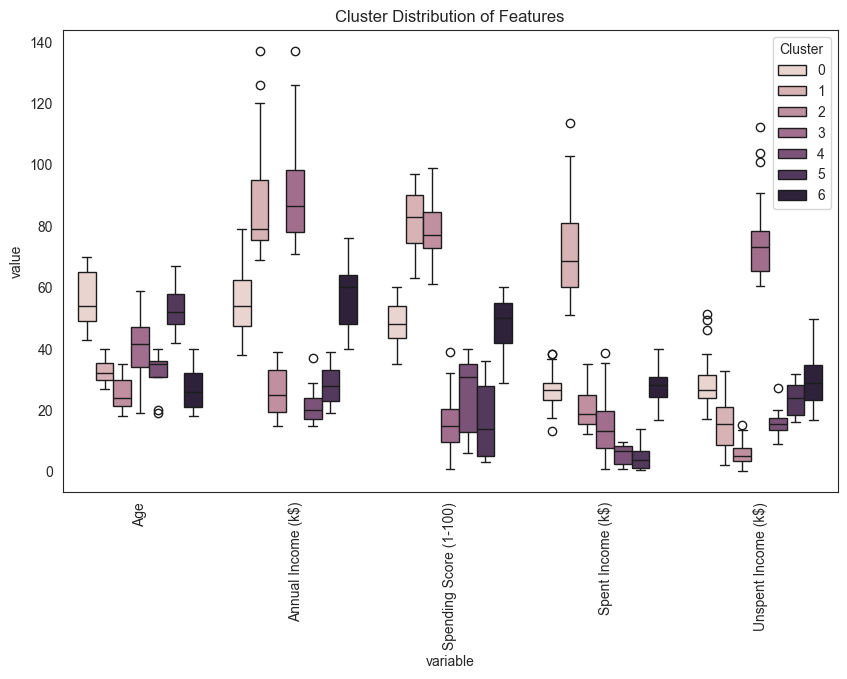

In [367]:
# Melt the dataframe to long format
melted_data = pd.melt(data, id_vars=['Cluster'], value_vars=features)

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='variable', y='value', hue='Cluster', data=melted_data)
plt.xticks(rotation=90)
plt.title('Cluster Distribution of Features')
plt.show()

#### Cluster Distribution of Features - 7 clusters 
For features selected, they all seem to have a contribution in clustering as shown by the graph above. This confirms that are feature selection was appropriate. 

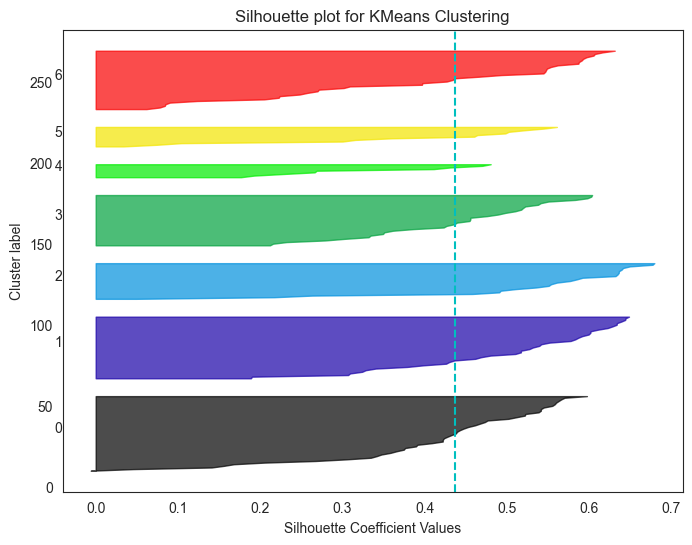

In [371]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import numpy as np

# Compute silhouette scores
silhouette_score = silhouette_score(scaled_data, kmeans.labels_)
sample_silhouette_values = silhouette_samples(scaled_data, kmeans.labels_)

# Plot silhouette scores
plt.figure(figsize=(8, 6))
y_lower = 10
for i in range(num_clusters):
    ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / num_clusters)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 1
# Drawing Average Score
plt.axvline(silhouette_score, linestyle='--', c='c')
plt.title("Silhouette plot for KMeans Clustering")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster label")
plt.show()


### Silouhette Score Graph Analysis
None of the clusters have below average score, therefore the clutering number of 7 is an appropriate choice. 

## Final Thoughts

To maximize business value from the identified customer segments, we can leverage targeted marketing, product customization, and improved customer experience. Let's align these strategies with the identified segments and feature engineering:

1. **Targeted Marketing**:
   - **Tailored Campaigns**: Customize marketing campaigns for each segment based on their unique characteristics and preferences.
   - **Increased Engagement**: Engage customers through personalized messages, offers, and promotions that resonate with their needs and behaviors.
   - **Enhanced Brand Loyalty**: Foster stronger connections with customers by delivering relevant content and experiences.

2. **Product Customization**:
   - **Segment-Specific Offerings**: Develop products and services tailored to the needs and desires of each segment, considering factors like age, income, and spending habits.
   - **Innovative Solutions**: Introduce new features or variations of existing products to address specific pain points or opportunities identified within each segment.
   - **Differentiated Value Propositions**: Highlight unique benefits and value propositions that appeal to the preferences and priorities of each segment.

3. **Improved Customer Experience**:
   - **Personalized Interactions**: Provide personalized recommendations, support, and communication channels based on individual preferences and behaviors.
   - **Streamlined Processes**: Simplify and optimize customer touchpoints, such as purchasing, support, and feedback collection, to enhance convenience and satisfaction.
   - **Reward Programs**: Implement loyalty programs, rewards, and incentives tailored to each segment to encourage repeat business and foster loyalty.

### Implementation Strategies for Segments:
1. **Low Income and Low Spending**:
   - Offer budget-friendly products/services with flexible payment options.
   - Provide educational resources on financial management and saving strategies.

2. **Low Income and High Spending**:
   - Focus on affordability and value for money in product offerings.
   - Highlight cost-saving benefits and discounts to encourage repeat purchases.
   - Probably have a high ratio of credit card debt to income ratio, maybe appropriate credit card offerings for this segment

3. **Middle Income and Middle Spending**:
   - Emphasize quality, reliability, and convenience in products/services.
   - Offer moderate-priced bundles or packages tailored to specific needs.

4. **High Income and Low Spending**:
   - As mentioned above, Investment opportunities and services, Savings plan, mutual funds and portfolio management services
   - Introduce premium or luxury products/services with exclusive benefits.
   - Provide personalized concierge services or VIP experiences to enhance value perception.

5. **High Income and High Spending**:
   - Showcase premium offerings with premium features and benefits.
   - Create elite membership programs with exclusive perks and privileges.

By leveraging the segmented approach and targeted strategies, businesses can effectively meet the diverse needs and preferences of their customer base, driving engagement, loyalty, and ultimately, business growth. These efforts can lead to increased customer satisfaction, higher retention rates, and improved profitability in the long term.

Learnt so much from this assignment. Thanks Again Paul and James for this wonderful course and the assignments. Almost sad that there are no more assignments to do. 
